# Bevezetés

**Agytumor (glioblastoma) automatikus szegmentálása mély neuron háló segítségével**

Munkám alapjául szolgál a BraTS Chellenge verseny (state-of-art) 

Tanító adatbázis: 369 db előre feldolgozott mpMRI felvételek (koponya eltávolítása, kizárólag az agy) - és hozzájuk tartozó tumor körbe rajzolások (több orvos egymást ellenőrizve jelölte ki a daganatot)

Validációs adatbázis: 125 db előre feldolgozott mpMRI felvételek (koponya eltávolítása, kizárólag az agy) - tumor szegmentálása nélkül


#Csatlakozás a Google Drivehoz és a könyvtárak telepítése

In [68]:
from google.colab import drive
import os
drive.mount('/content/drive',force_remount=True)
os.chdir('/content/drive/My Drive/BraTSDataset')

Mounted at /content/drive


In [69]:
os.listdir()

['Model Checkpoints',
 'Model_logs',
 'Saved Models',
 'Test Data',
 'Training Data',
 'Validation Data',
 'Bemutato',
 'model.png',
 'Irodalmazás és kódok',
 'Teszt',
 'Extracted Datas',
 '.patchteszt1_original.npy',
 '.patchteszt1_original_gt.npy',
 'teszt_patch__40db.npy',
 'irodalmi_attekinto_nemeskolos.doc',
 'patchteszt1_2d_tissue2.npy',
 'wh_50_100_patch.npy',
 'en_50_100_patch.npy',
 'oe_50_100_patch.npy',
 'unet.png',
 'Diploma_munka']

#MRI felvételek beolvasása

Képek beolvasása:

*   N4 bias field correction (alcsony intenzitású voxelek törlése)
*   Zero mean unit variance normalization (érték -1 és 1 között lesz)

Hátrány: korrekciót és normalizálást használva a beolvasási idő drasztikusan megugrik (nélüle: ~10 mp , korr+norn: ~2000 mp) - viszont csak egyszer kell ezt elvégezni


Mappa rendszer: Dataset/mriscanfolder/flair,seg,t1,t1c,t2 .ni.gz



In [ ]:
import SimpleITK as sitk 
from tqdm import tqdm
import numpy as np
from __future__ import print_function
import sys
import os
from skimage import measure
import statistics


In [ ]:
path = './eleresi_ut_mri/'

## Beolvasás (négy modalitást külön fájlok tartalmazzák)

In [ ]:
def load_data(path):
  my_dir = sorted(os.listdir(path))
  data = []
  gt = []
  for p in tqdm(my_dir):
    data_list = sorted(os.listdir(path+p))
   
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[0])
    flair = sitk.GetArrayFromImage(img_itk)
  
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[1])    
    t1 =  sitk.GetArrayFromImage(img_itk)
 
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[2])
    t1ce =  sitk.GetArrayFromImage(img_itk)
 
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[3])
    t2 =  sitk.GetArrayFromImage(img_itk)
   
    data.append([flair,t1,t1ce,t2])

  data = np.asarray(data,dtype=np.float16)
  data = data[:,:,30:120,30:222,30:222]
  return data

## Beolvasás (egy nifti fájl tartalmazza mind a négy modalitást)

In [ ]:
def load_data(path):
  my_dir = sorted(os.listdir(path))
  data = []
  gt = []
  for p in tqdm(my_dir):
    data_list = sorted(os.listdir(path+p))
   
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[0])
    img = sitk.GetArrayFromImage(img_itk)

    img_itk = sitk.ReadImage(path + p + '/'+ data_list[1])
    seg =  sitk.GetArrayFromImage(img_itk)
   
    data.append(img)
    gt.append(seg)

  data = np.asarray(data,dtype=np.float32)
  gt = np.asarray(gt,dtype=np.uint8)
  return data,gt

## Beolvasás normalizációval és N4 bias field correction-nel

In [ ]:
def load_data(path):
  my_dir = sorted(os.listdir(path))
  data = []
  gt = []
  for p in tqdm(my_dir):
    data_list = sorted(os.listdir(path+p))
   
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[0])
    maskImage = sitk.OtsuThreshold(img_itk,0,1,200)
    inputImage = sitk.Cast(img_itk,sitk.sitkFloat32)
    corrector = sitk.N4BiasFieldCorrectionImageFilter();
    output = corrector.Execute(inputImage,maskImage)
    img_norm = output
    img_norm = (img_norm -statistics.mean(img_norm)) / statistics.variance(img_norm)
    flair = sitk.GetArrayFromImage(img_norm)

    img_itk = sitk.ReadImage(path + p + '/'+ data_list[1])
    seg =  sitk.GetArrayFromImage(img_itk)

    img_itk = sitk.ReadImage(path + p + '/'+ data_list[2])
    maskImage = sitk.OtsuThreshold(img_itk,0,1,200)
    inputImage = sitk.Cast(img_itk,sitk.sitkFloat32)
    corrector = sitk.N4BiasFieldCorrectionImageFilter();
    output = corrector.Execute(inputImage,maskImage)
    img_norm = output
    img_norm = (img_norm -statistics.mean(img_norm)) / statistics.variance(img_norm)
    t1 = sitk.GetArrayFromImage(img_norm)

    img_itk = sitk.ReadImage(path + p + '/'+ data_list[3])
    maskImage = sitk.OtsuThreshold(img_itk,0,1,200)
    inputImage = sitk.Cast(img_itk,sitk.sitkFloat32)
    corrector = sitk.N4BiasFieldCorrectionImageFilter();
    output = corrector.Execute(inputImage,maskImage)
    img_norm = output
    img_norm = (img_norm -statistics.mean(img_norm)) / statistics.variance(img_norm)
    t1ce = sitk.GetArrayFromImage(img_norm)

    img_itk = sitk.ReadImage(path + p + '/'+ data_list[4])
    maskImage = sitk.OtsuThreshold(img_itk,0,1,200)
    inputImage = sitk.Cast(img_itk,sitk.sitkFloat32)
    corrector = sitk.N4BiasFieldCorrectionImageFilter();
    output = corrector.Execute(inputImage,maskImage)
    img_norm = output
    img_norm = (img_norm -statistics.mean(img_norm)) / statistics.variance(img_norm)
    t2 = sitk.GetArrayFromImage(img_norm)

    data.append([flair,t1,t1ce,t2])
    gt.append(seg)

  data = np.asarray(data,dtype=np.float32)
  gt = np.asarray(gt,dtype=np.uint8)
  return data,gt

## Beolvasás normalizációval és N4 bias field correction-nel

In [ ]:
def load_data(path):
  my_dir = sorted(os.listdir(path))
  data = []
  gt = []
  for p in tqdm(my_dir):
    data_list = sorted(os.listdir(path+p))
   
    img_itk = sitk.ReadImage(path + p + '/'+ data_list[0])
    maskImage = sitk.OtsuThreshold(img_itk,0,1,200)
    inputImage = sitk.Cast(img_itk,sitk.sitkFloat32)
    corrector = sitk.N4BiasFieldCorrectionImageFilter();
    output = corrector.Execute(inputImage,maskImage)
    img_norm = output
    img_norm = (img_norm -statistics.mean(img_norm)) / statistics.variance(img_norm)
    flair = sitk.GetArrayFromImage(img_norm)

    img_itk = sitk.ReadImage(path + p + '/'+ data_list[1])
    seg =  sitk.GetArrayFromImage(img_itk)

    img_itk = sitk.ReadImage(path + p + '/'+ data_list[2])
    maskImage = sitk.OtsuThreshold(img_itk,0,1,200)
    inputImage = sitk.Cast(img_itk,sitk.sitkFloat32)
    corrector = sitk.N4BiasFieldCorrectionImageFilter();
    output = corrector.Execute(inputImage,maskImage)
    img_norm = output
    img_norm = (img_norm -statistics.mean(img_norm)) / statistics.variance(img_norm)
    t1 = sitk.GetArrayFromImage(img_norm)

    img_itk = sitk.ReadImage(path + p + '/'+ data_list[3])
    maskImage = sitk.OtsuThreshold(img_itk,0,1,200)
    inputImage = sitk.Cast(img_itk,sitk.sitkFloat32)
    corrector = sitk.N4BiasFieldCorrectionImageFilter();
    output = corrector.Execute(inputImage,maskImage)
    img_norm = output
    img_norm = (img_norm -statistics.mean(img_norm)) / statistics.variance(img_norm)
    t1ce = sitk.GetArrayFromImage(img_norm)

    img_itk = sitk.ReadImage(path + p + '/'+ data_list[4])
    maskImage = sitk.OtsuThreshold(img_itk,0,1,200)
    inputImage = sitk.Cast(img_itk,sitk.sitkFloat32)
    corrector = sitk.N4BiasFieldCorrectionImageFilter();
    output = corrector.Execute(inputImage,maskImage)
    img_norm = output
    img_norm = (img_norm -statistics.mean(img_norm)) / statistics.variance(img_norm)
    t2 = sitk.GetArrayFromImage(img_norm)

    data.append([flair,t1,t1ce,t2])
    gt.append(seg)

  data = np.asarray(data,dtype=np.float32)
  gt = np.asarray(gt,dtype=np.uint8)
  return data,gt

## Kiválasztott beolvasási forma indítása, és eredményének mentése egy numpy tömbe

In [ ]:

data,gt = load_data(path)
print(data.shape, data.dtype, gt.shape, gt.dtype)
np.save('./eleresi_ut/adat.npy',data)
np.save('./eleresi_ut/cimkek.npy',gt)

100%|██████████| 5/5 [3:41:25<00:00, 2657.01s/it]


(5, 4, 155, 240, 240) float32 (5, 155, 240, 240) uint8


# Adatok előfeldolgozása

Az adatok előfeldolgozása már az előző részben elkezdődött. A beolvasás közben az adatok tömbe mentése oly módon történt, hogy közben el lett rajtuk végze N4 bias field correction, és  zero mean unit normalizáció. Ebben a részben elsősorban a kép formáját, méretét fogom változtatni. Tanítás során kétféleképpen használom az adatokat. Az egyik, ahol egész képeket adok a hálónak tanításhoz. Itt csupán a felvételek méretein csökkentettem, illetve a 3D adatokat 2D szeletekre bontottam. A másik pedig ahol 3D patch-eket készítettem. A patch-ek létrehozás mellett válogattam is azokat. Először felbontottam a patch-ekre a felvételeket, majd azokat elöszőr úgy válogattam, hogy ahol a háttér voxelek aránya meghaladja a 20%-kot azokat kidobtam, kivéve amelyik tartalmaz a tumoros szövetből részekeket. Ez után tovább válogattam, kiszedtam az olyan patch-eket ahol található tumor, és ezekhez ugyan annyi darab tumor nélküli, de agyszövete tartalmazó patch-et raktam. Így a tumoros és nem tumoros agyszövetek patch-ei ugyan olyan arányban vannak jelen a tanulóhalmazban. 
(Ebben a részben egy darab felvételt fogok szerkeszteni)

## 2D teljes felvételek előfeldolgozása

### Adatok méretének csökkentése

Az eredeti felvételek 155 x 240 x 240 felbontásúak. Ezt csökkentjük 144 x 192 x 192 felbontásra. A vágásnál a felvételek széle kerül eltávolításra, ami csak a háttér. Mindegyik érték ugyan annyi helyet foglal el (float32) a memóriában így ezek törlése jelentős tárhely igény csökkenést eredményez (kb.: - 40,5 %). 

In [31]:
import numpy as np

data = np.load('Diploma_munka/data_bemutato_pre.npy')
gt = np.load('Diploma_munka/gt_bemutato_pre.npy')

print(data.shape)
print(gt.shape)

(1, 4, 155, 240, 240)
(1, 155, 240, 240)


In [32]:
import numpy as np

print('Original shape of datas:')
print(data.shape)
print(gt.shape)

reduced_data = data[:,:,6:150,30:222,30:222]
reduced_gt = gt[:,6:150,30:222,30:222]

print('Reduced shape of datas:')

np.save('Diploma_munka/data_bemutato_pre_reduced.npy', reduced_data)
print(reduced_data.shape)

np.save('Diploma_munka/gt_bemutato_pre_reduced.npy', reduced_gt)
print(reduced_gt.shape)

Original shape of datas:
(1, 4, 155, 240, 240)
(1, 155, 240, 240)
Reduced shape of datas:
(1, 4, 144, 192, 192)
(1, 144, 192, 192)


### További előfeldolgozás 

In [33]:
data = np.load('Diploma_munka/data_bemutato_pre_reduced.npy')
gt = np.load('Diploma_munka/gt_bemutato_pre_reduced.npy')

print(data.shape,gt.shape)

(1, 4, 144, 192, 192) (1, 144, 192, 192)


In [34]:
data = np.transpose(data,(0,2,3,4,1)) #(képsorszáma,modalitás,x,y,z) -> (képsorszám, x,y,z, modalitás)
print(data.shape,gt.shape)

(1, 144, 192, 192, 4) (1, 144, 192, 192)


In [35]:
data = data.reshape([-1,192,192,4]) #így tudjuk szétszedni szeletekre a 3D felvételeket
gt = gt.reshape([-1,192,192,1]) #144 db 192 x 192 kép

print(data.shape,gt.shape)

(144, 192, 192, 4) (144, 192, 192, 1)


In [36]:
gt[np.where(gt==4)]=3   #One-hot encoding: 4 -> 3 (3-mas érték a kimenetben 4. osztályként jelenik meg)

In [38]:
from sklearn.model_selection import train_test_split #tömbök felosztása tanítási és validációs részhalmazokra - egy darab 3D -s felvételre is müködik a bemutatóban

X_train, X_val, Y_train, Y_val = train_test_split(data, gt, test_size=0.25,random_state=42)

print(X_train.shape, X_val.shape, Y_train.shape, Y_val.shape)

(108, 192, 192, 4) (36, 192, 192, 4) (108, 192, 192, 1) (36, 192, 192, 1)


In [40]:
from tensorflow.keras.utils import to_categorical #a categorical a meglévő osztály vektorokat bináris vektorokká konvertálja
Y_train = to_categorical(Y_train)
Y_val = to_categorical(Y_val)

print(X_val.shape, Y_val.shape)

(36, 192, 192, 4) (36, 192, 192, 4)


In [42]:
np.save('./Diploma_munka/X_train.npy',X_train)
np.save('./Diploma_munka/Y_train.npy',Y_train)
np.save('./Diploma_munka/X_val.npy',X_val)
np.save('./Diploma_munka/Y_val.npy',Y_val)

print(X_train.shape, X_val.shape, Y_train.shape, Y_val.shape)

(108, 192, 192, 4) (36, 192, 192, 4) (108, 192, 192, 4) (36, 192, 192, 4)


In [52]:
print(data.shape,gt.shape)

(144, 192, 192, 4) (144, 192, 192, 1)


Number of slice:0


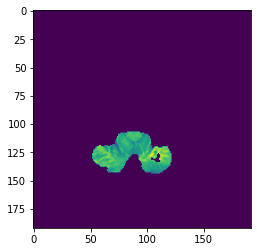

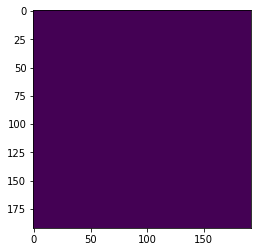

Number of slice:1


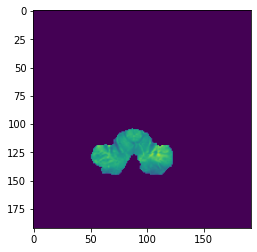

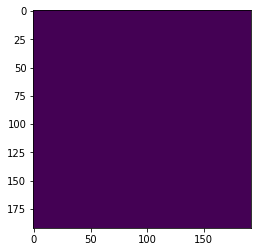

Number of slice:2


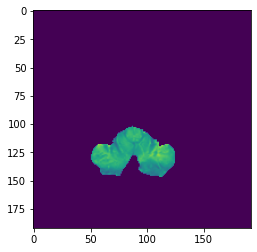

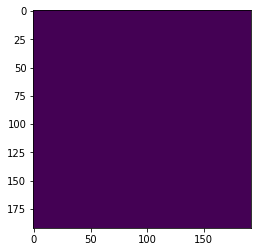

Number of slice:3


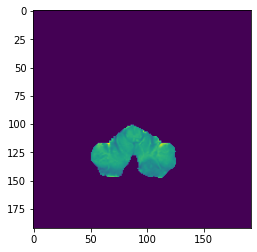

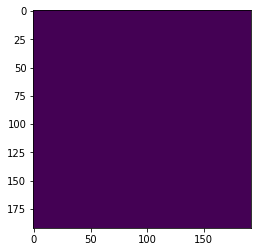

Number of slice:4


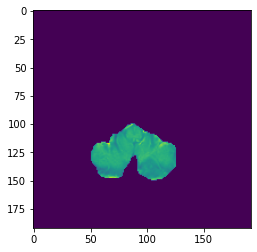

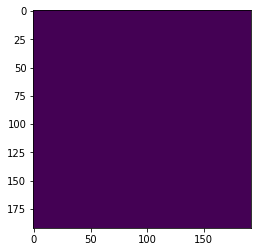

Number of slice:5


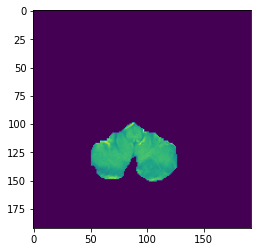

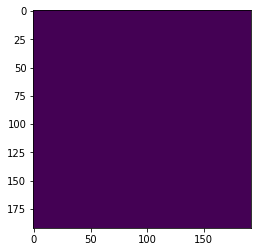

Number of slice:6


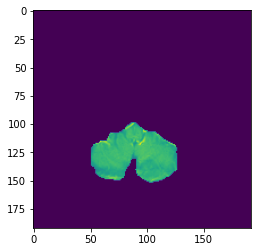

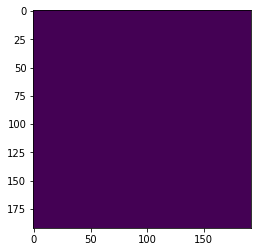

Number of slice:7


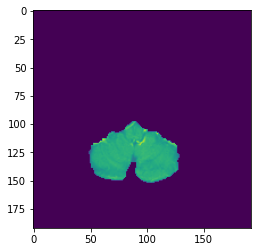

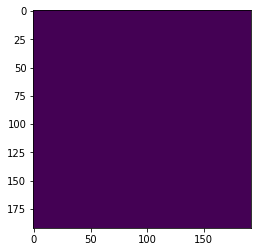

Number of slice:8


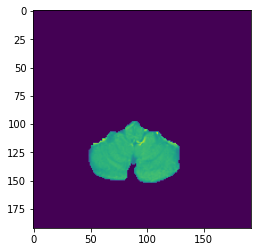

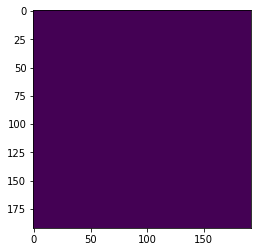

Number of slice:9


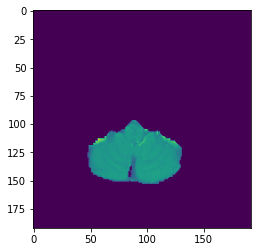

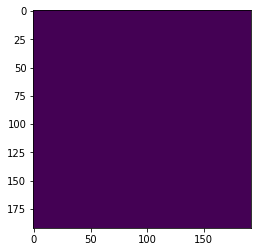

Number of slice:10


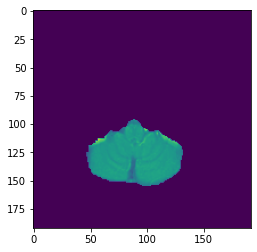

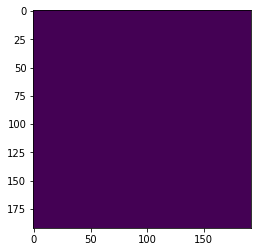

Number of slice:11


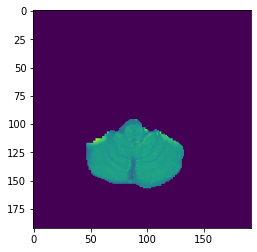

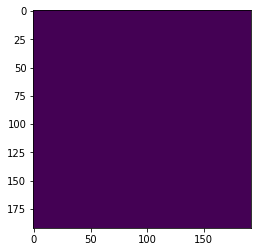

Number of slice:12


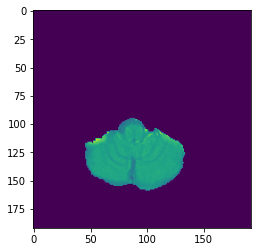

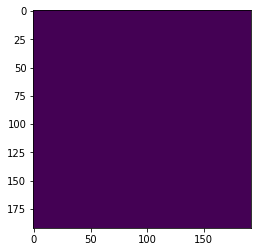

Number of slice:13


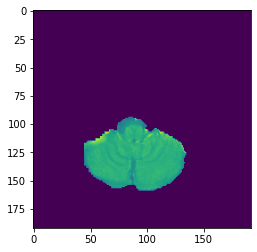

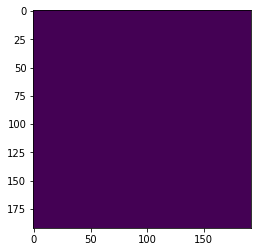

Number of slice:14


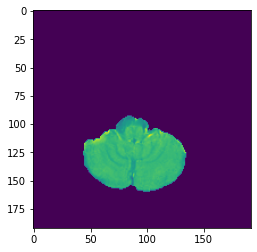

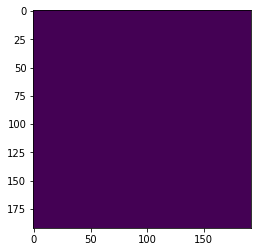

Number of slice:15


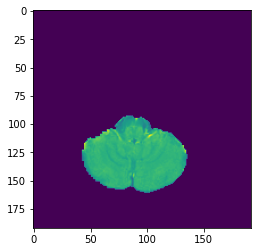

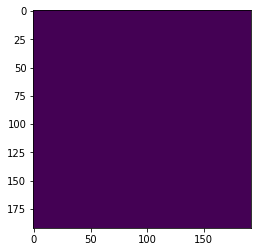

Number of slice:16


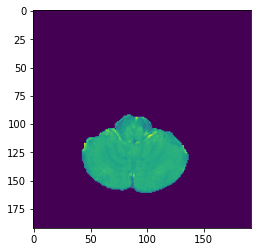

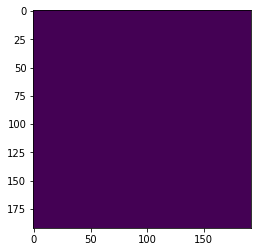

Number of slice:17


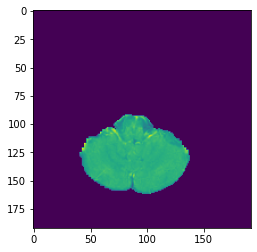

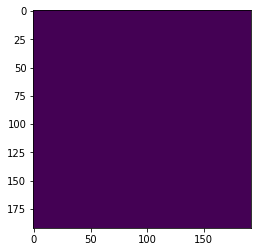

Number of slice:18


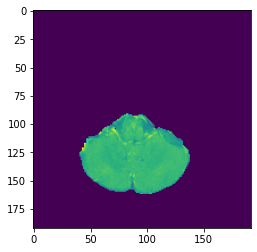

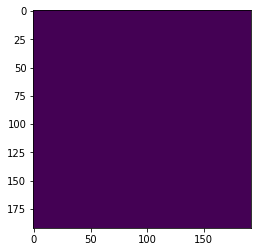

Number of slice:19


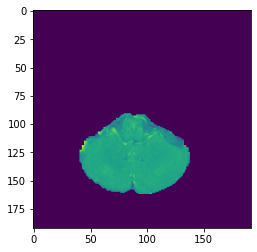

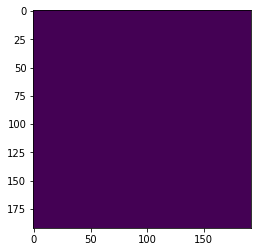

Number of slice:20


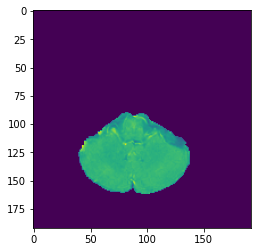

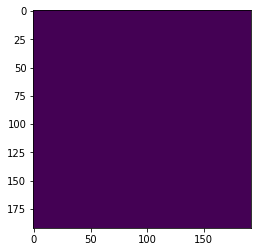

Number of slice:21


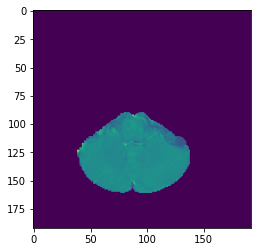

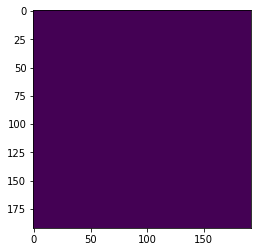

Number of slice:22


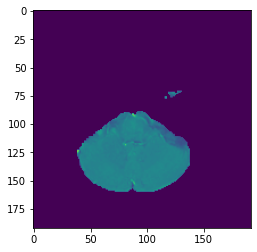

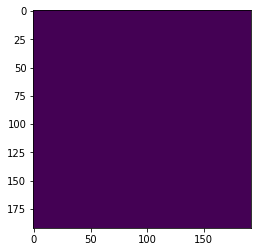

Number of slice:23


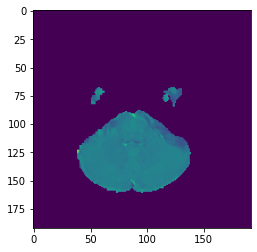

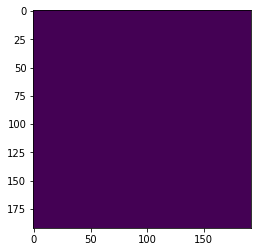

Number of slice:24


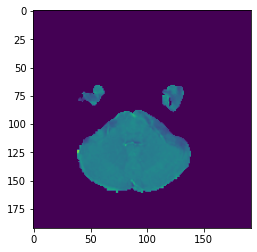

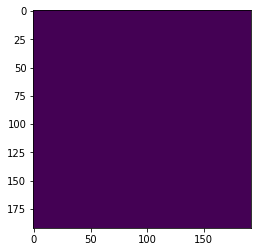

Number of slice:25


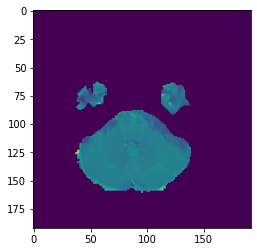

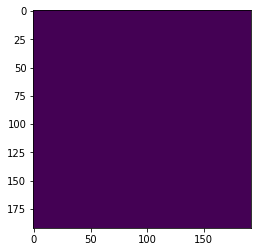

Number of slice:26


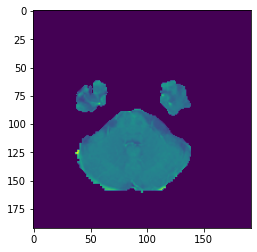

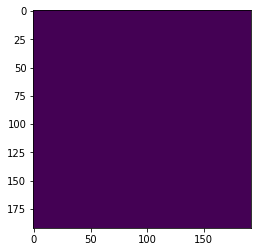

Number of slice:27


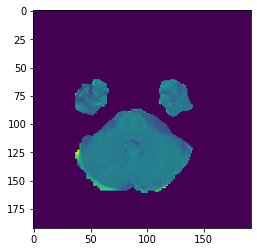

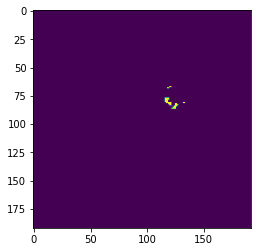

Number of slice:28


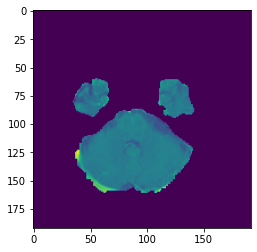

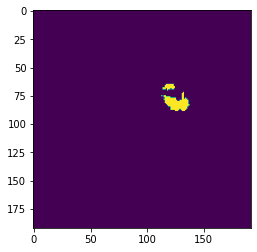

Number of slice:29


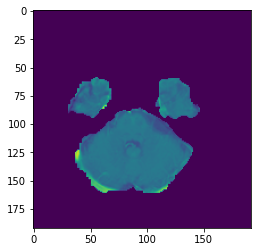

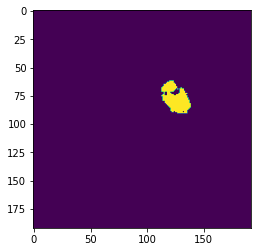

Number of slice:30


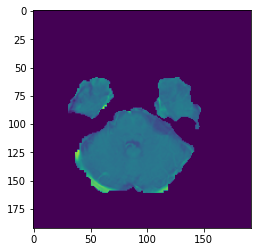

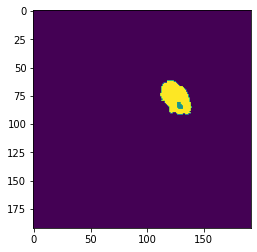

Number of slice:31


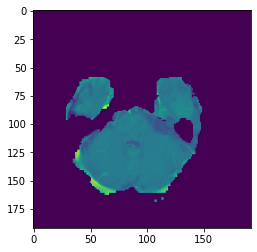

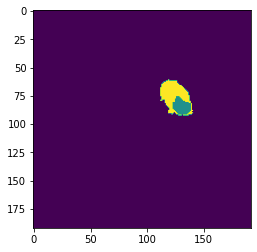

Number of slice:32


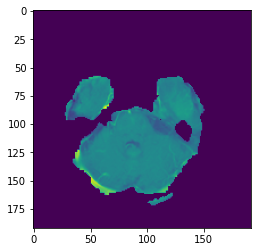

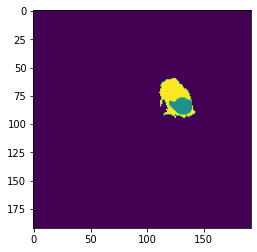

Number of slice:33


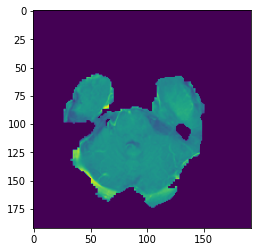

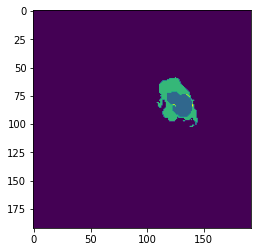

Number of slice:34


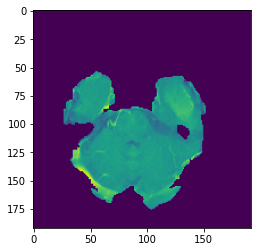

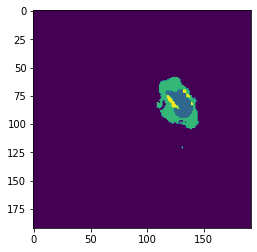

Number of slice:35


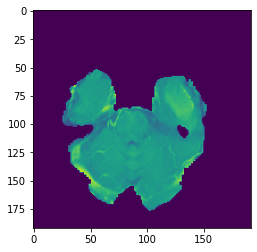

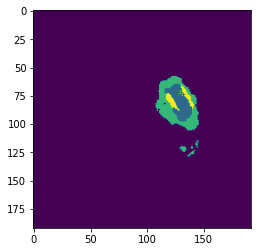

Number of slice:36


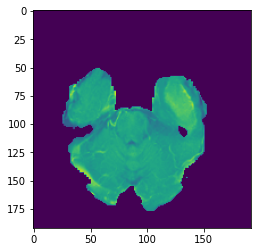

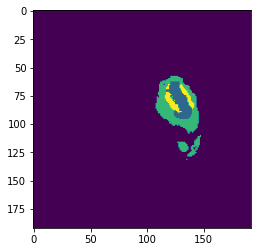

Number of slice:37


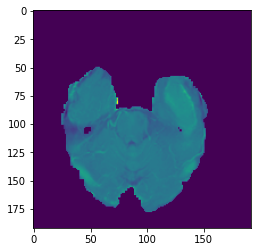

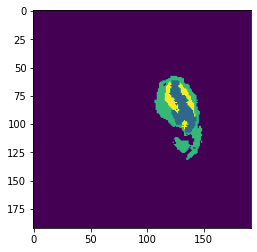

Number of slice:38


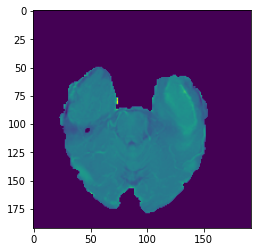

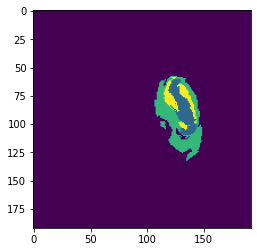

Number of slice:39


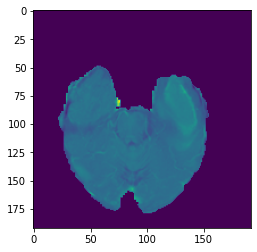

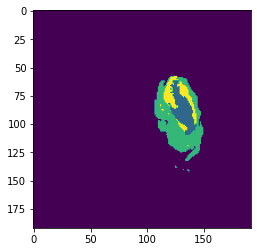

Number of slice:40


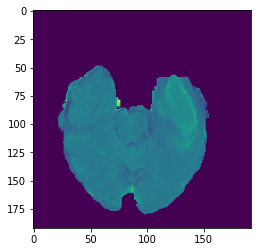

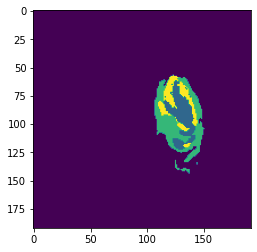

Number of slice:41


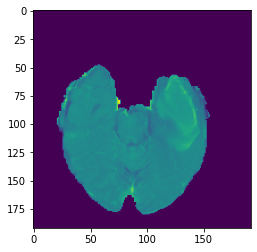

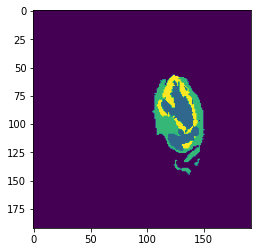

Number of slice:42


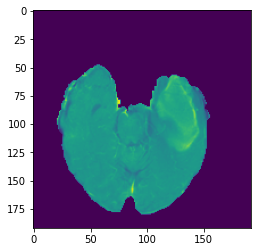

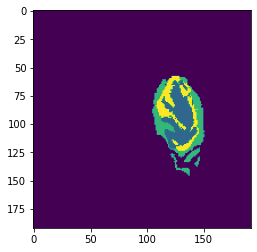

Number of slice:43


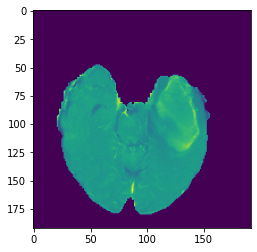

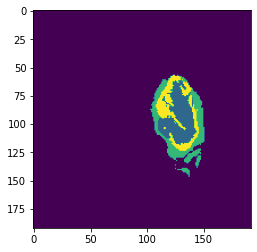

Number of slice:44


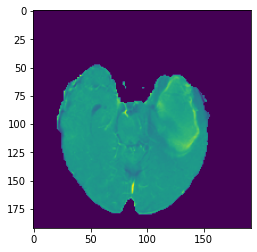

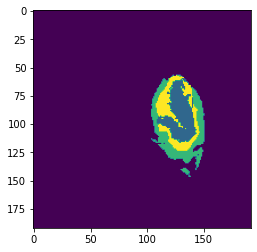

Number of slice:45


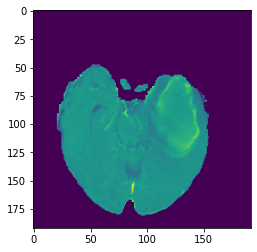

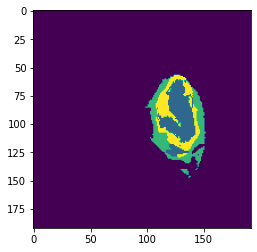

Number of slice:46


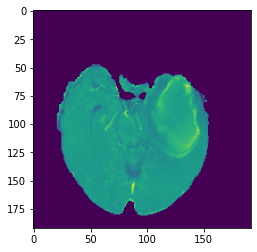

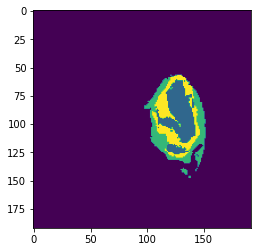

Number of slice:47


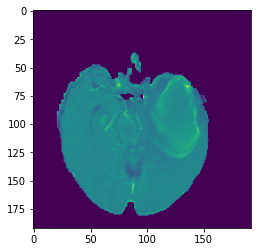

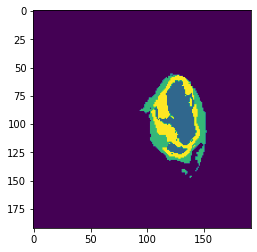

Number of slice:48


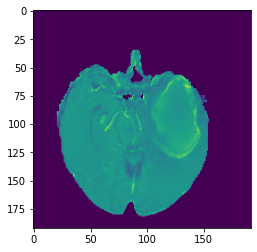

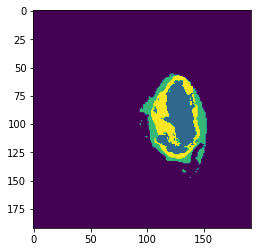

Number of slice:49


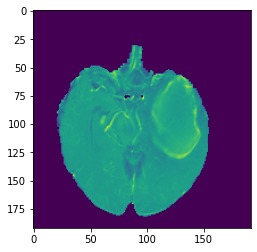

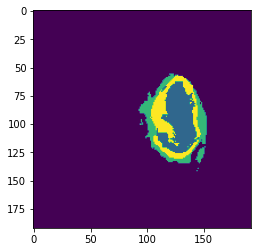

Number of slice:50


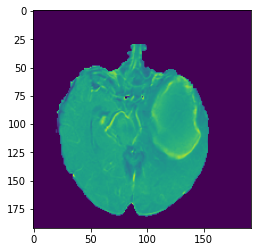

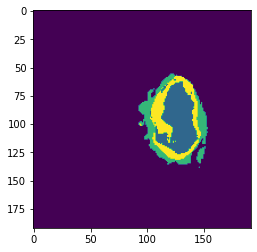

Number of slice:51


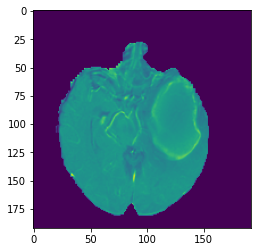

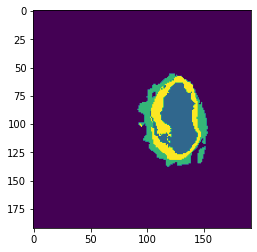

Number of slice:52


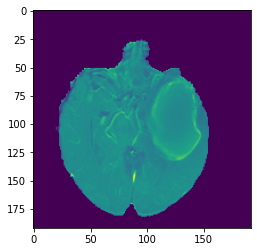

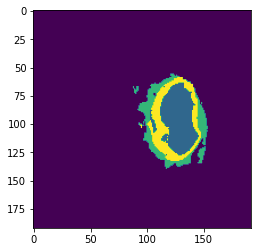

Number of slice:53


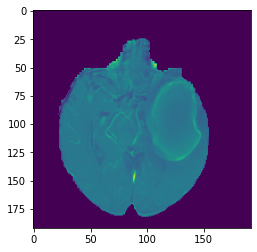

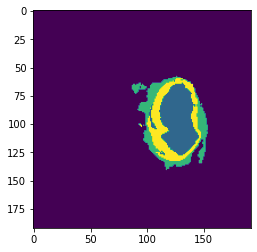

Number of slice:54


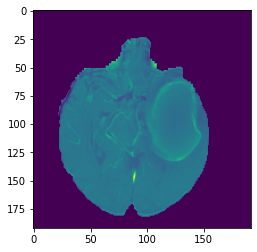

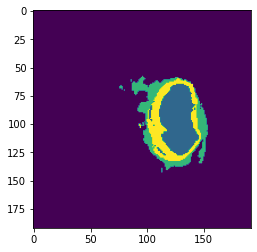

Number of slice:55


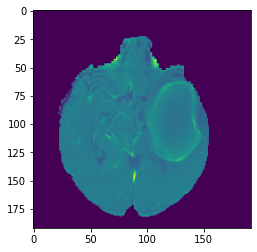

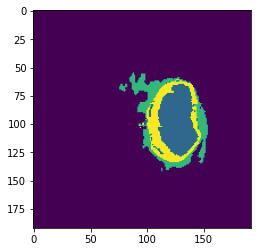

Number of slice:56


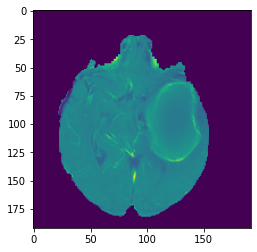

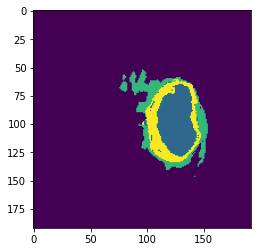

Number of slice:57


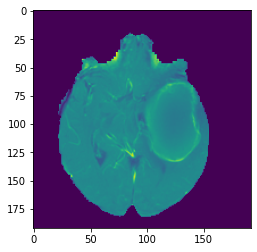

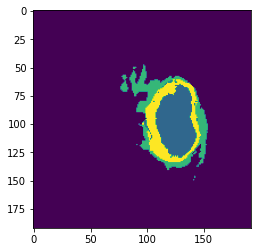

Number of slice:58


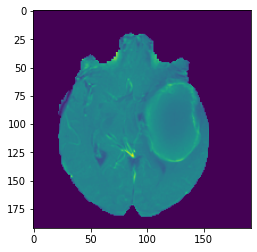

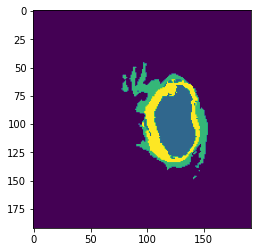

Number of slice:59


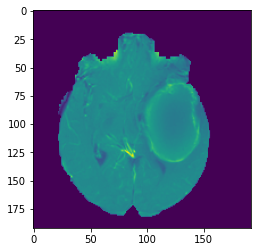

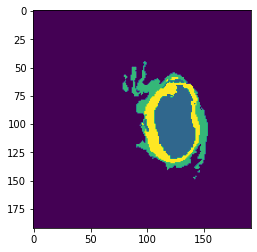

Number of slice:60


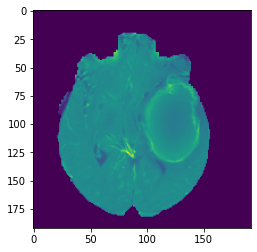

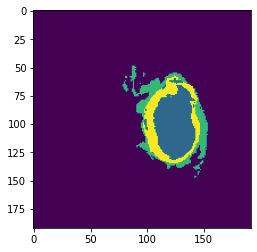

Number of slice:61


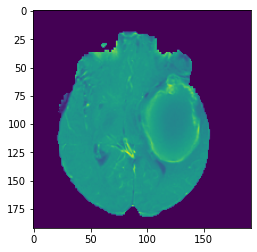

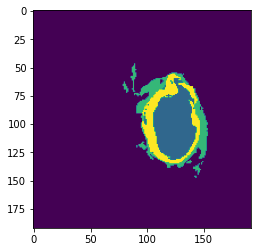

Number of slice:62


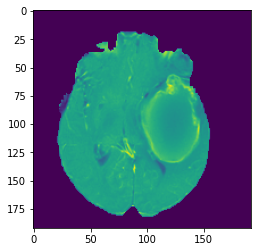

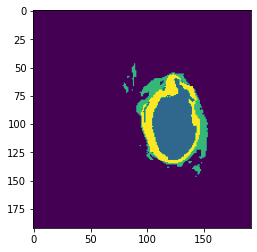

Number of slice:63


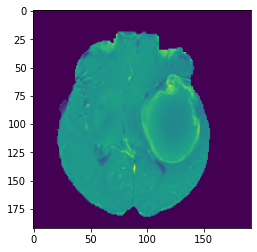

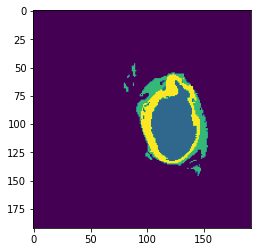

Number of slice:64


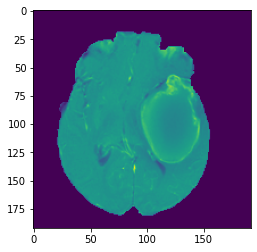

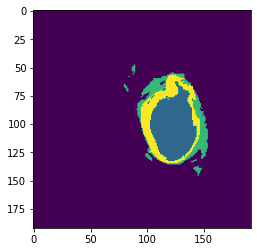

Number of slice:65


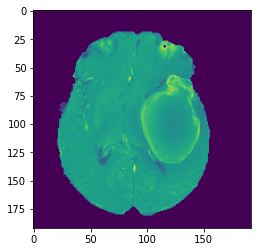

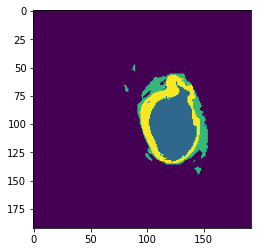

Number of slice:66


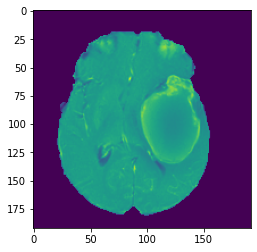

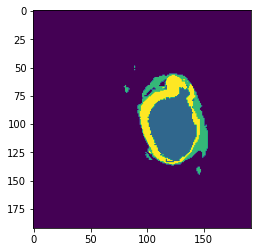

Number of slice:67


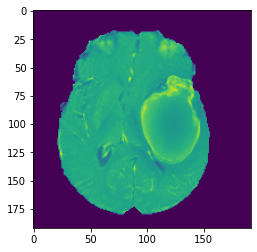

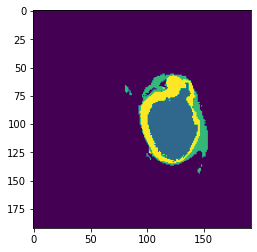

Number of slice:68


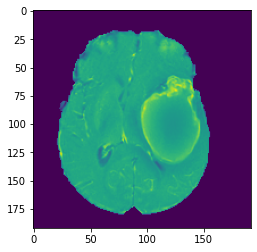

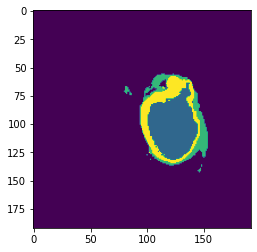

Number of slice:69


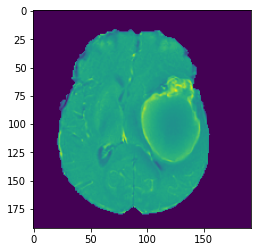

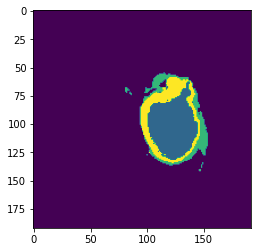

Number of slice:70


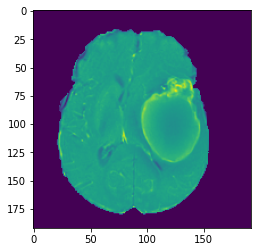

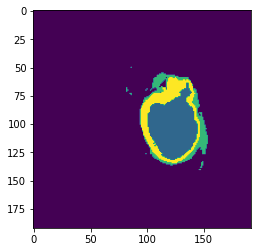

Number of slice:71


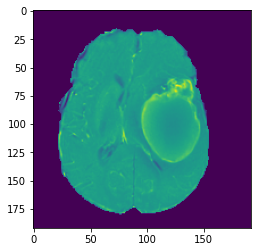

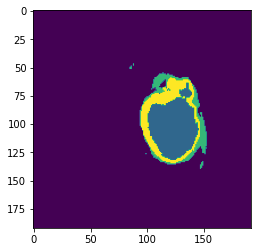

Number of slice:72


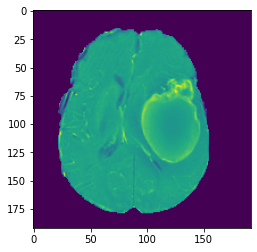

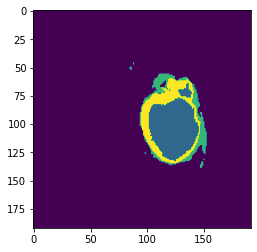

Number of slice:73


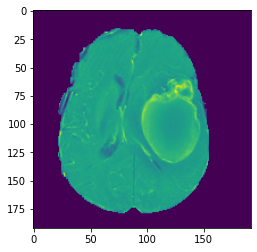

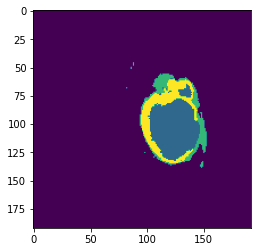

Number of slice:74


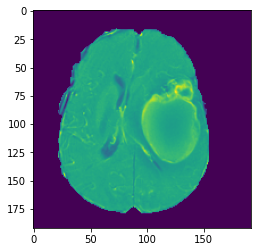

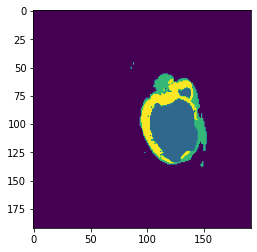

Number of slice:75


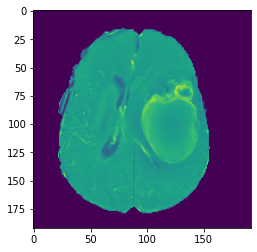

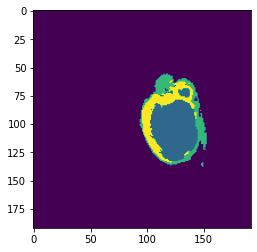

Number of slice:76


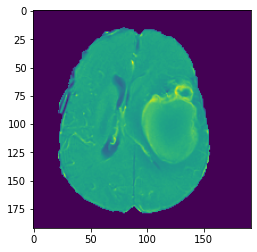

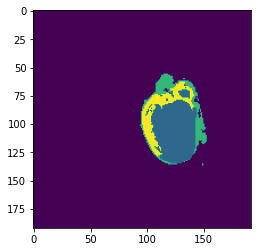

Number of slice:77


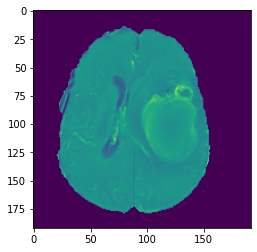

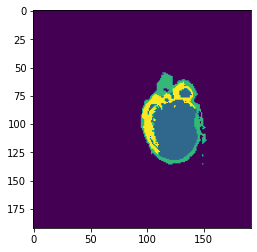

Number of slice:78


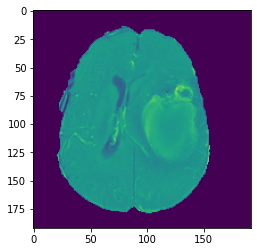

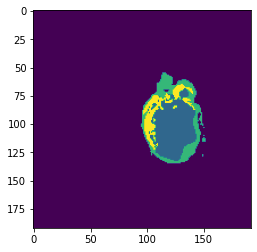

Number of slice:79


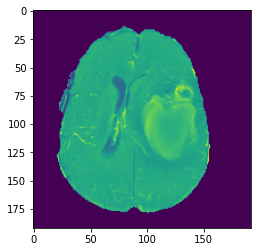

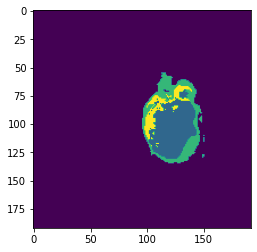

Number of slice:80


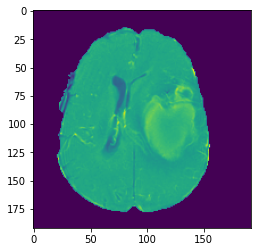

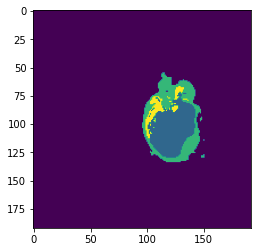

Number of slice:81


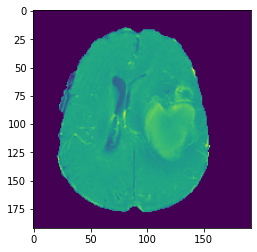

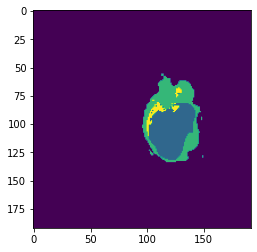

Number of slice:82


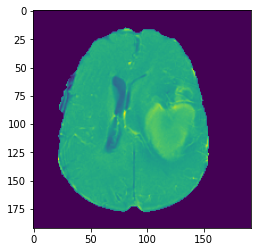

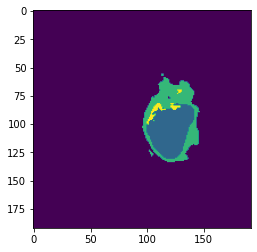

Number of slice:83


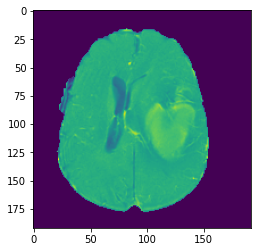

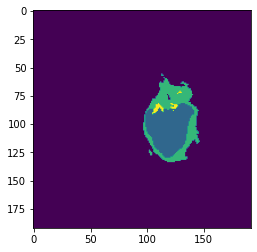

Number of slice:84


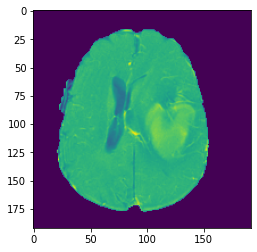

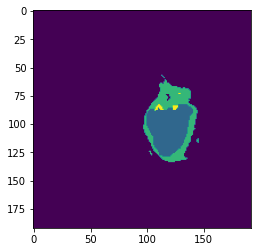

Number of slice:85


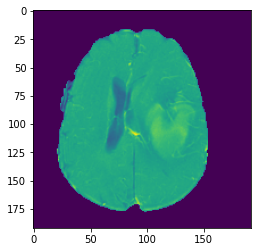

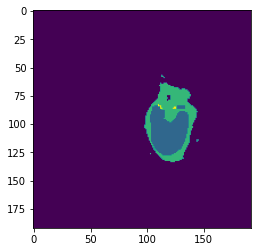

Number of slice:86


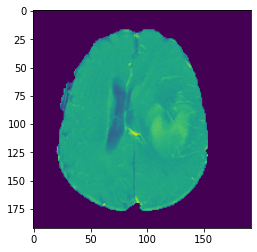

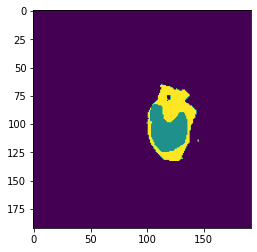

Number of slice:87


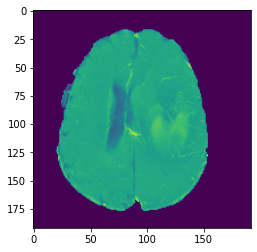

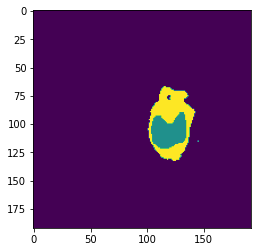

Number of slice:88


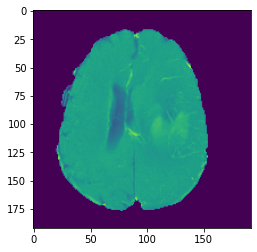

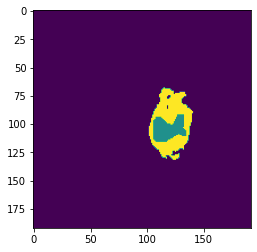

Number of slice:89


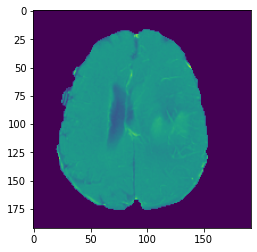

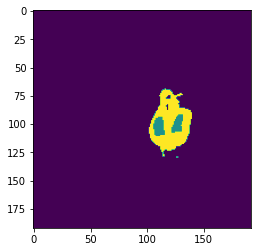

Number of slice:90


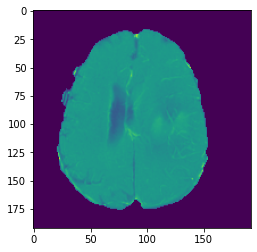

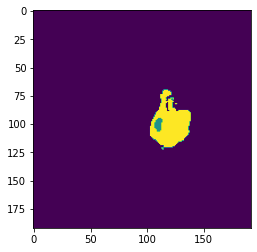

Number of slice:91


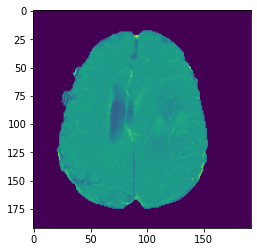

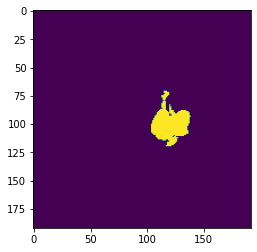

Number of slice:92


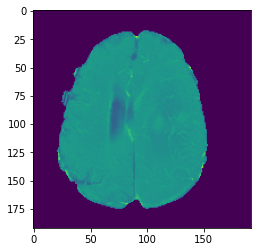

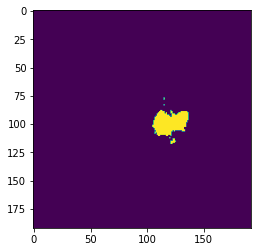

Number of slice:93


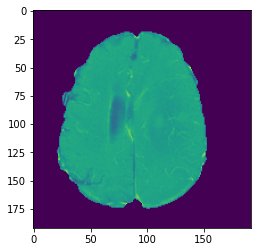

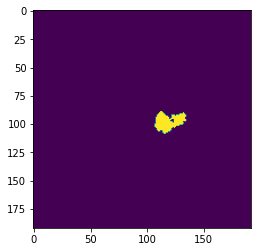

Number of slice:94


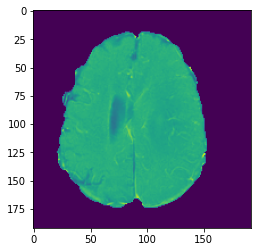

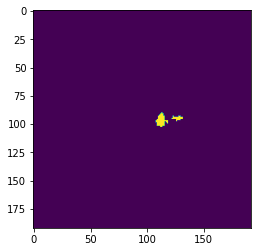

Number of slice:95


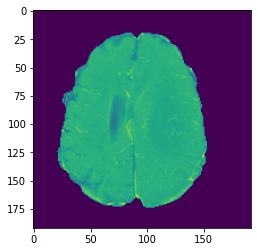

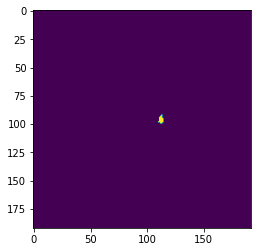

Number of slice:96


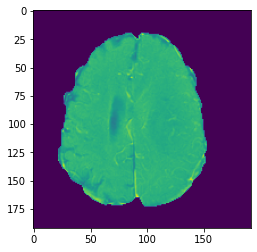

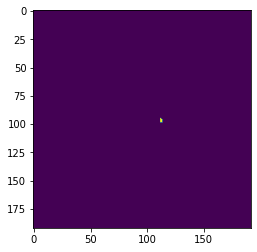

Number of slice:97


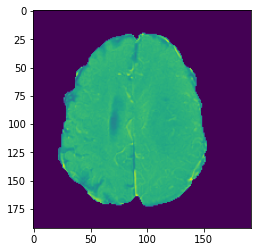

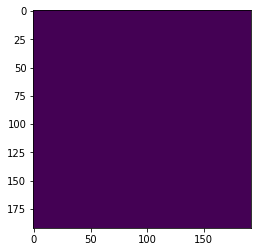

Number of slice:98


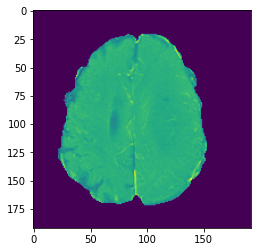

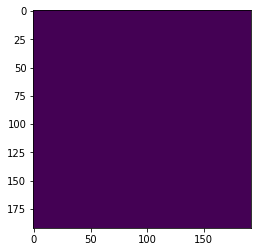

Number of slice:99


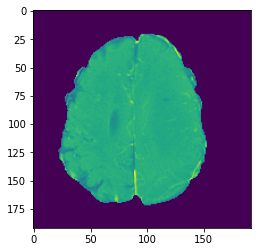

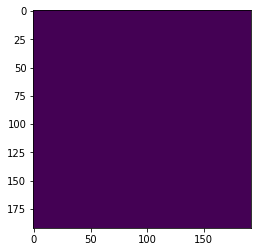

Number of slice:100


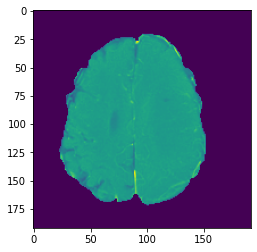

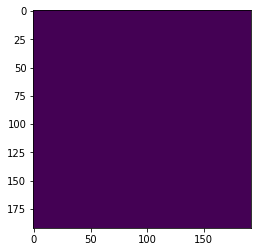

Number of slice:101


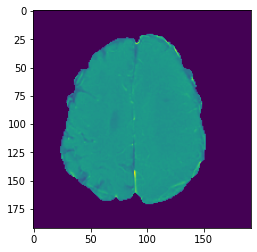

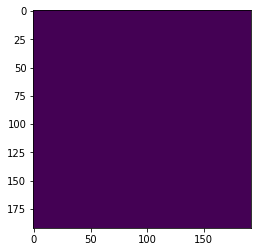

Number of slice:102


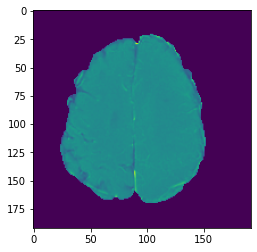

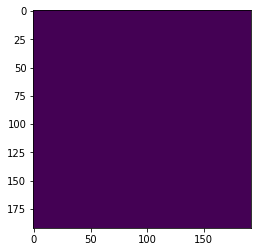

Number of slice:103


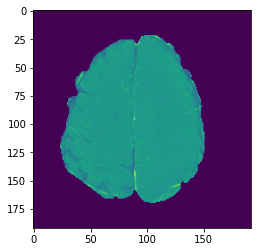

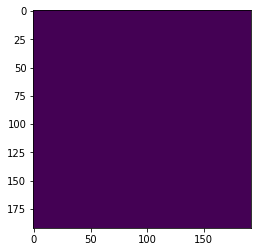

Number of slice:104


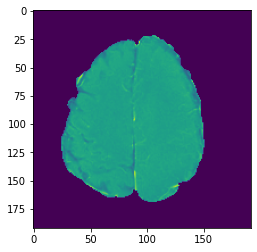

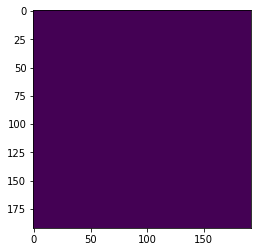

Number of slice:105


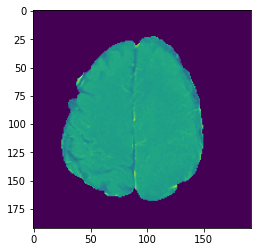

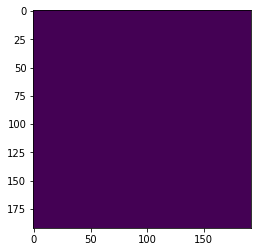

Number of slice:106


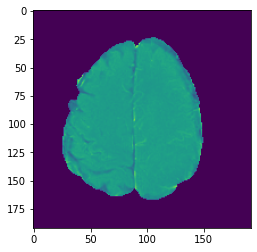

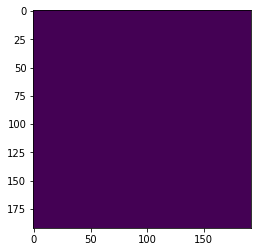

Number of slice:107


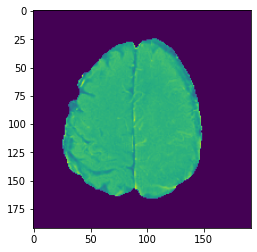

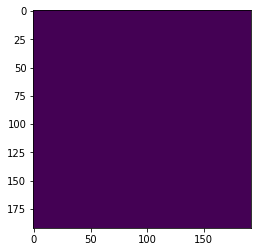

Number of slice:108


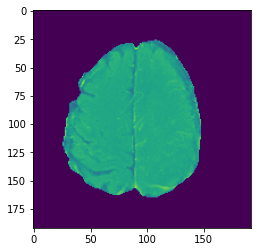

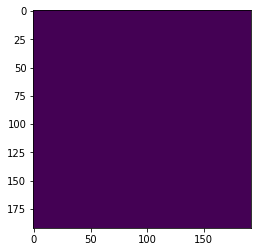

Number of slice:109


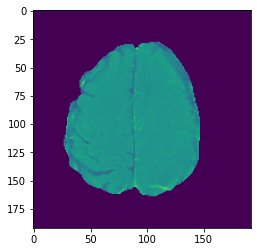

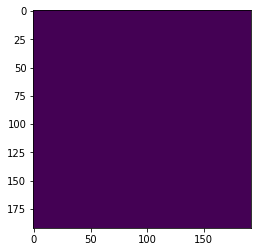

Number of slice:110


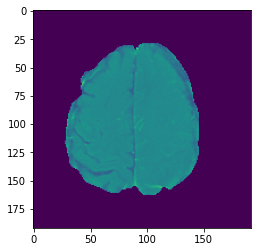

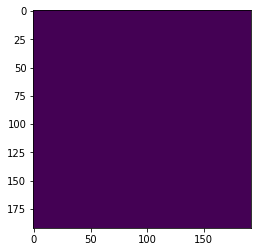

Number of slice:111


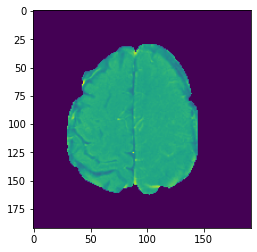

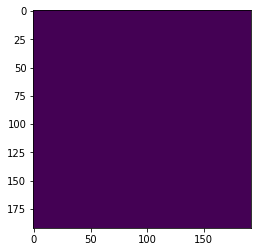

Number of slice:112


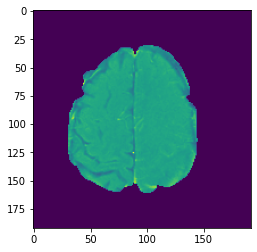

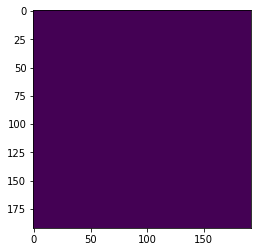

Number of slice:113


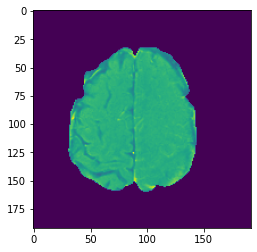

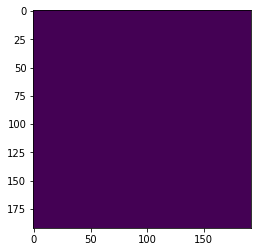

Number of slice:114


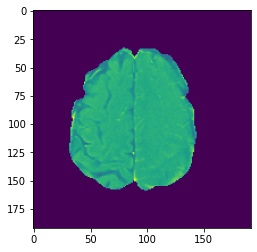

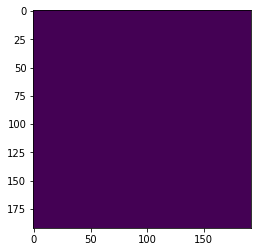

Number of slice:115


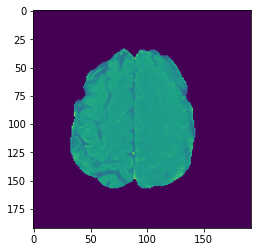

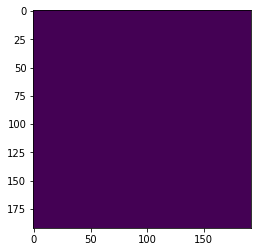

Number of slice:116


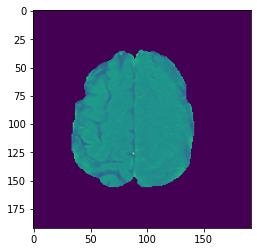

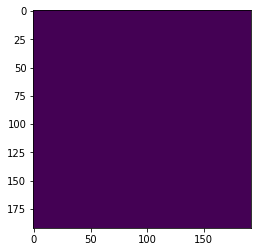

Number of slice:117


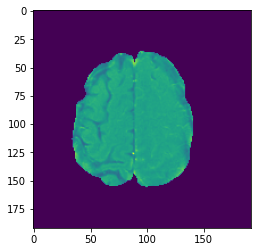

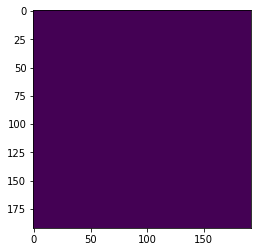

Number of slice:118


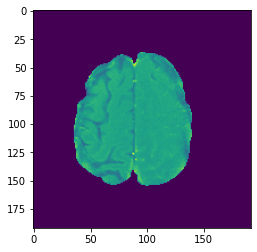

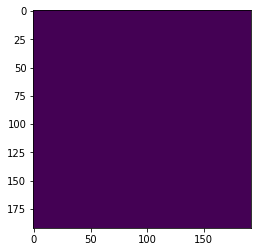

Number of slice:119


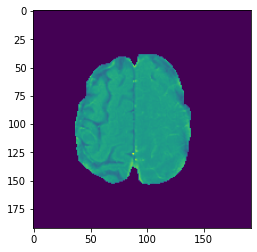

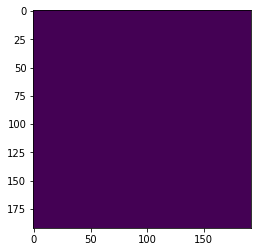

Number of slice:120


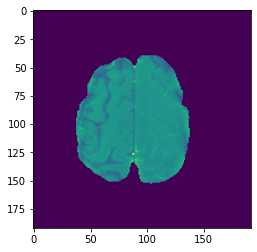

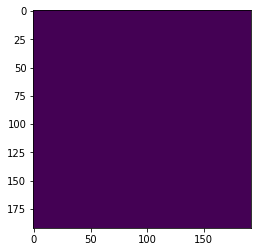

Number of slice:121


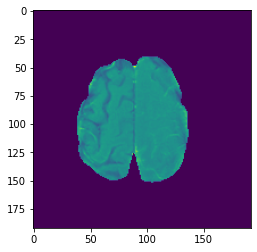

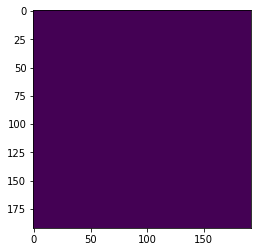

Number of slice:122


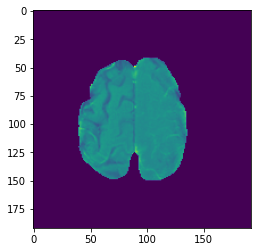

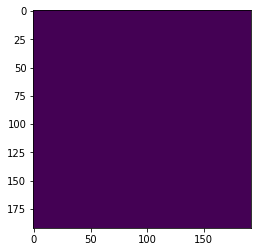

Number of slice:123


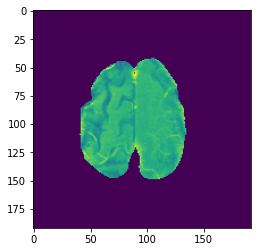

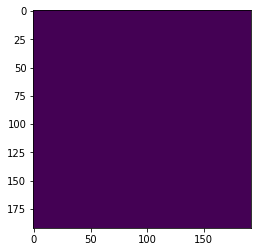

Number of slice:124


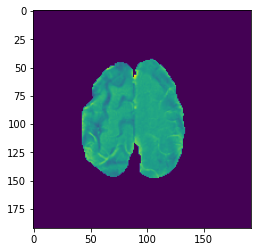

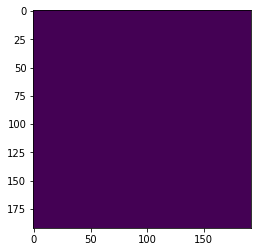

Number of slice:125


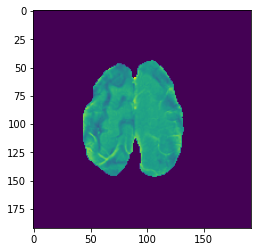

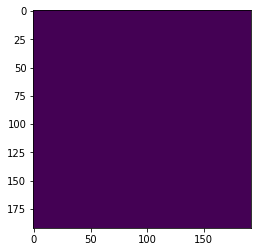

Number of slice:126


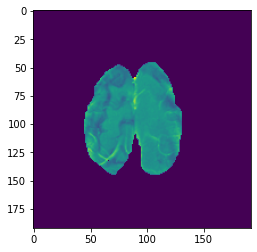

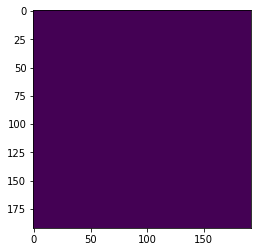

Number of slice:127


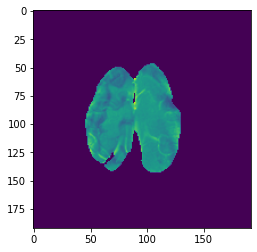

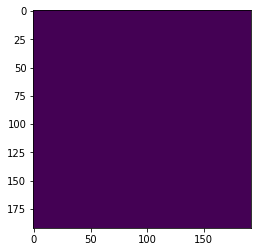

Number of slice:128


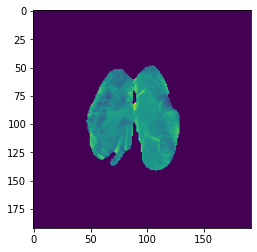

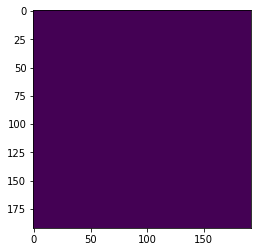

Number of slice:129


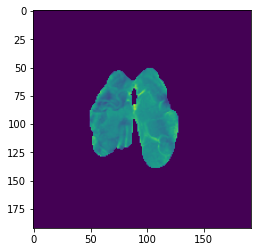

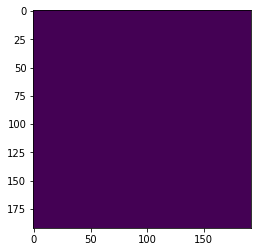

Number of slice:130


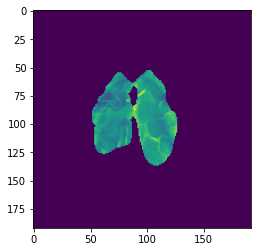

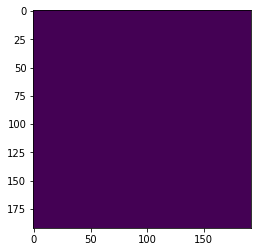

Number of slice:131


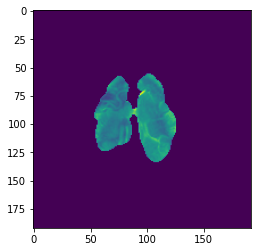

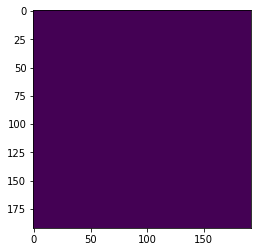

Number of slice:132


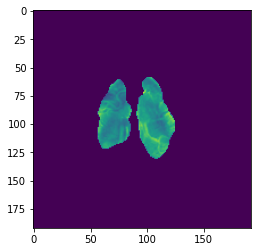

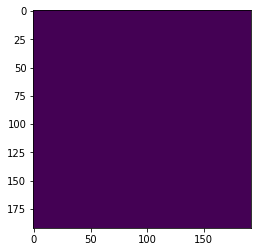

Number of slice:133


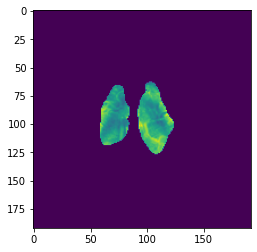

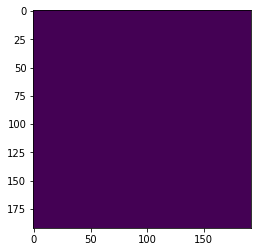

Number of slice:134


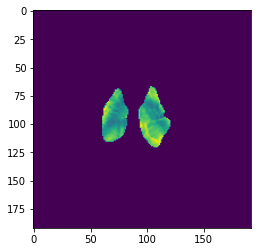

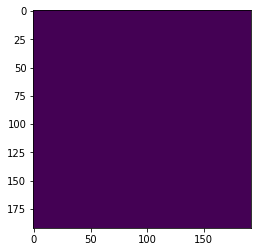

Number of slice:135


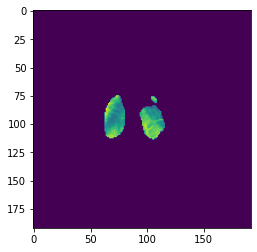

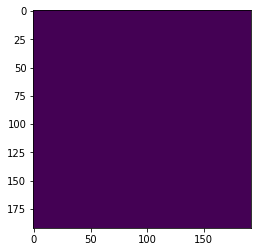

Number of slice:136


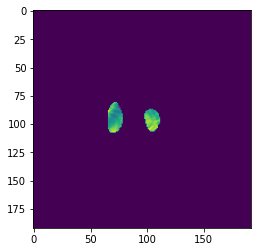

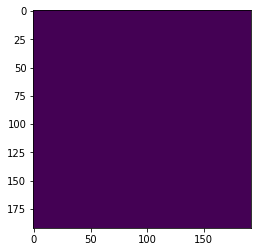

Number of slice:137


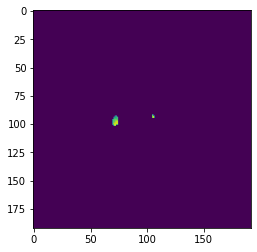

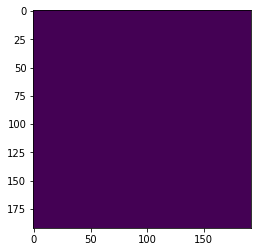

Number of slice:138


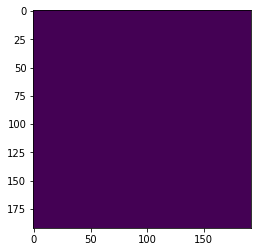

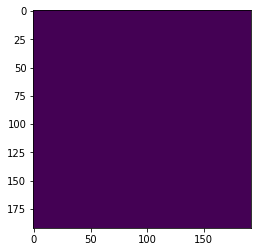

Number of slice:139


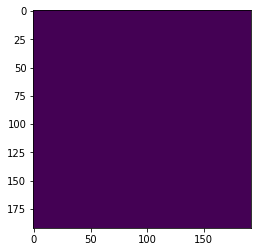

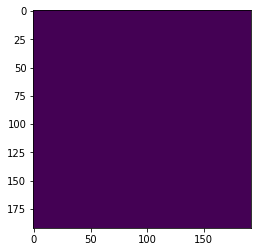

Number of slice:140


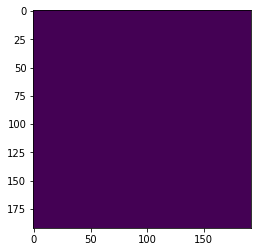

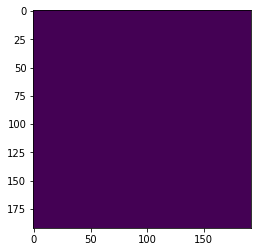

Number of slice:141


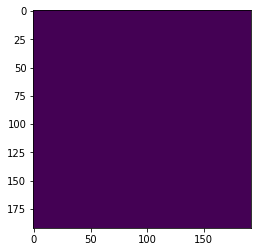

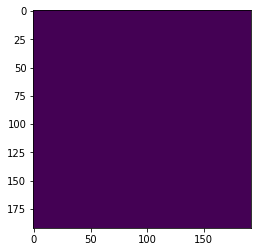

Number of slice:142


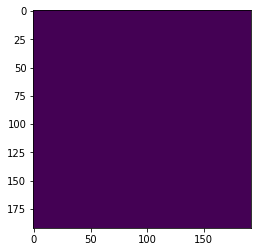

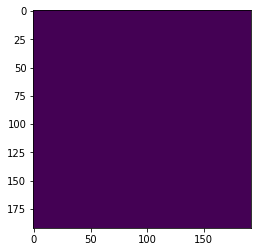

Number of slice:143


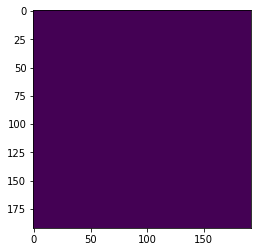

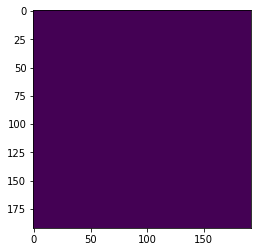

In [54]:
import matplotlib.pyplot as plt
for i in range(0,144):
  print('Number of slice:' + str(i))
  plt.imshow(data[i,:,:,2])
  plt.show()
  plt.imshow(gt[i,:,:,0])
  plt.show()


## 3D patch-ek létrehozása, válogatás, 2D konvertálás, visszaalakítás




*   MRI felvételek: felvételek száma, modalitás, 144 x 192 x 192
*   Kontúr: kontúrok száma, 144 x 192 x 192
*   Patch méretének választásánál figyelni kell arra hogy, a patch méretei oszthatóak legyenek a feldarabolni kívánt felvétel méreteivel.




  1. div változó megadja azt hogy, az eredeti felvételt hányad része legyen egy patch. Ennek oszthatónak kell lennie a egyes dimenziók hosszával. 
  2. Patch dimenzióinak hosszának kiszámítása.
  3. Felvételek dimenzióinak transzponálása, olyan módon hogy, a modalitás (channel) az utolsó legyen, majd az így előálló mátrix első dimenzióját (felvételek száma) egyesítjük a mátrix második dimenziójával, ezzel a 3D -os képekből 2D-osat állítunk elő
  4. Majd ugyan ezt elvégezzük a kontúrokkal is trnaszponálást kihagyva.


*   Patch-ek visszaalakításának kizárólag a prediktált kontúrnál van szükség, mivel a többi esetében meg van az eredeti fájlunk. A lépések megegyeznek a patch készítésénél haználtakkal azzal a különbséggel hogy, visszafelé végezzük el a lépéseket. 

### Patch és patch visszalakítás definiálása

In [106]:
import numpy as np
from skimage.util import view_as_blocks


def patch(data,gt,div): # beolvasott mri felvételek, kontúr, patch-ek hányad része az mri felvételeknek

  
  data = np.asarray(data,dtype=np.float32)
  gt = np.asarray(gt,dtype=np.uint8)

  x_2 = data.shape[2] / div
  x = np.int8(x_2)
  print(x)

  y = data.shape[3] / div
  y = np.int8(y)
  print(y)
  
  z = data.shape[4] / div
  z = np.int8(z)
  print(z)

  data = np.transpose(data, (0,2,3,4,1)).reshape(-1,data.shape[3],data.shape[3],4)
  patch_data=(view_as_blocks(data, (x,y,z,4)))
  patch_data=patch_data.reshape(-1,y,z,4)
  print(patch_data.shape)

  gt= gt.reshape(-1,gt.shape[2],gt.shape[3])
  patch_gt=(view_as_blocks(gt, (x,y,z)))
  patch_gt=patch_gt.reshape(-1,y,z)

  print('Patchek méretek:', patch_data.shape, 'és', patch_gt.shape)

  np.save('./patch.npy', patch_data)
  np.save('./patch_gt.npy', patch_gt)

  print('Patch-ek mentve numpy tömbbe.')
  
  return patch_data,patch_gt

In [112]:
import numpy as np


def back_patch(x,y,z,a,b,c,multiple,path_load):

  import numpy as np

  patch_gt = np.load(path_load)
  print(patch_gt.shape)

  patch_gt = patch_gt.reshape([-1,32,32])
  print(patch_gt.shape)
  
  x = np.int16(x)
  print(x)
  y = np.int16(y)
  print(y)
  z = np.int16(z)
  print(z)

  a = np.int16(a)
  print(a)
  b = np.int16(b)
  print(b)
  c = np.int16(c)
  print(c)


  x1 = ((patch_gt.shape[0] / multiple ** 3)/24)
  x1 = np.int16(x1)
  print(x1)


  patch_gt = patch_gt.reshape(x1,multiple ** 3,x,y,z)
  print(patch_gt.shape)
  patch_gt = patch_gt.reshape(x1,multiple,multiple ** 2,x,y,z)
  print(patch_gt.shape)
  patch_gt = patch_gt.reshape(x1,multiple,multiple,multiple,x,y,z)
  print(patch_gt.shape)
  backpatch_gt = patch_gt.transpose(0,1,4,2,5,3,6)
  print(backpatch_gt.shape)
  backpatch_gt1 = backpatch_gt.reshape(x1,-1,multiple,y,multiple,z)
  print(backpatch_gt1.shape)
  backpatch_gt2 = backpatch_gt1.reshape(x1,a,-1,multiple,z)
  print(backpatch_gt2.shape)
  backpatch_gt3 = backpatch_gt2.reshape(x1,a,b,-1)
  print(backpatch_gt3.shape)

 

  return backpatch_gt3

In [104]:
def back_patch_data(x,y,z,a,b,c,multiple,path_load):

  import numpy as np

  patch_data = np.load(path_load)
  print(patch_data.shape)

  patch_data = patch_data.reshape([-1,32,32,4])
  print(patch_data.shape)
  
  x = np.int16(x)
  print(x)
  y = np.int16(y)
  print(y)
  z = np.int16(z)
  print(z)

  a = np.int16(a)
  print(a)
  b = np.int16(b)
  print(b)
  c = np.int16(c)
  print(c)


  x1 = ((patch_data.shape[0] / multiple ** 3)/24)
  x1 = np.int16(x1)
  print(x1)


  patch_data = patch_data.reshape(x1,multiple ** 3,x,y,z,4)
  print(patch_data.shape)
  patch_data = patch_data.reshape(x1,multiple,multiple ** 2,x,y,z,4)
  print(patch_data.shape)
  patch_data = patch_data.reshape(x1,multiple,multiple,multiple,x,y,z,4)
  print(patch_data.shape)
  backpatch_data = patch_data.transpose(0,1,4,2,5,3,6,7)
  print(backpatch_data.shape)
  backpatch_data1 = backpatch_data.reshape(x1,-1,multiple,y,multiple,z,4)
  print(backpatch_data1.shape)
  backpatch_data2 = backpatch_data1.reshape(x1,a,-1,multiple,z,4)
  print(backpatch_data2.shape)
  backpatch_data3 = backpatch_data2.reshape(x1,a,b,-1,4)
  print(backpatch_data3.shape)

  

  return backpatch_data3


### Patch készítés és válogatás

In [108]:
data = np.load('Diploma_munka/data_bemutato_pre_reduced.npy')
gt = np.load('Diploma_munka/gt_bemutato_pre_reduced.npy')

adat,kontur = patch(data, gt, 6)

print('Patch méretek: \n')
print(adat.shape,kontur.shape) #eredetileg 2D s patchket kapunk amit reshape után 3 D á alakítunk
x = np.int16((adat.shape[0]) / 24)
print(x)

adat = adat.reshape(x,24,32,32,4) # x db felvétel annyi patchet eredményez ami az eslő értéks
kontur = kontur.reshape(x,24,32,32)

print(adat.shape,kontur.shape)

np.save('Diploma_munka/patch_data.npy',adat)
np.save('Diploma_munka/patch_gt.npy',kontur)

min0 = adat[0,0,0,0,0] #csak ellenőrzés képp
print(min0)
min1 = adat[0,0,0,0,1]
print(min1)
min2 = adat[0,0,0,0,2]
print(min2)
min3 = adat[0,0,0,0,3]
print(min3)

count0 = np.count_nonzero(adat[0,:,:,:,0] == min0) #modalitásonként az első patch ami mindig 0
print(count0)
count1 = np.count_nonzero(adat[0,:,:,:,1] == min1)
print(count1)
count2 = np.count_nonzero(adat[0,:,:,:,2] == min2)
print(count2)
count3 = np.count_nonzero(adat[0,:,:,:,3] == min3)
print(count3)

gts=[]
datas=[]
data_empty=[]

print(count0 + count1 + count2 + count3)

for p in range (adat.shape[0]):

  if p % 216 == 0: #x patch egy felvétel (eredeti méretet hányadára csökkentjük és annak a köbe - 3D)
  
    min0 = adat[p,0,0,0,0] #sarki voxel mindig háttér érték és tudjuk hogy hol van
    print(min0)

  count0 = np.count_nonzero(adat[p,:,:,:,0] == min0) 
  data_in = adat[p,:,:,:,:]
  gt_in = kontur[p,:,:,:]
  if count0 ==24576: #x y z szorzata a patchnél
    data_empty.append(data_in)
    
    
  else :
    datas.append(data_in)
    gts.append(gt_in) 

data_empty = np.asarray(data_empty,dtype=np.float32)  
datas = np.asarray(datas,dtype=np.float32)
gts = np.asarray(gts,dtype=np.uint8)

print(datas.shape,gts.shape, data_empty.shape)

np.save('Diploma_munka/data_bemutato_pre_reduced_patch.npy',datas)
np.save('Diploma_munka/gt_bemutato_pre_reduced_patch.npy',gts)

24
32
32
(5184, 32, 32, 4)
Patchek méretek: (5184, 32, 32, 4) és (5184, 32, 32)
Patch-ek mentve numpy tömbbe.
Patch méretek: 

(5184, 32, 32, 4) (5184, 32, 32)
216
(216, 24, 32, 32, 4) (216, 24, 32, 32)
-0.0031634253
-0.00064645836
-0.0017629707
-0.0020284785
24576
24576
24576
24576
98304
-0.0031634253
(133, 24, 32, 32, 4) (133, 24, 32, 32) (83, 24, 32, 32, 4)


In [71]:
adat = np.load('Diploma_munka/data_bemutato_pre_reduced_patch.npy')
kontur = np.load('Diploma_munka/gt_bemutato_pre_reduced_patch.npy')

print(adat.shape,kontur.shape) 



gts=[]
datas=[]
data_empty=[]
gt_empty=[]
gt_plus=[]
data_plus=[]


for p in range (kontur.shape[0]):

  count0 = np.count_nonzero(kontur[p,:,:,:] == 0)
  #print(count0) 
  data_in = adat[p,:,:,:,:]
  gt_in = kontur[p,:,:,:]
  if count0 ==24*32*32: #x y z szorzata a patchnél
    data_empty.append(data_in)
    gt_empty.append(gt_in)
    
  else :
    datas.append(data_in)
    gts.append(gt_in) 

data_empty = np.asarray(data_empty,dtype=np.float32)  
datas = np.asarray(datas,dtype=np.float32)
gt_empty = np.asarray(gt_empty,dtype=np.uint8)
gts = np.asarray(gts,dtype=np.uint8)

for i in range(gts.shape[0]):
    data_plus.append(data_empty[i,:,:,:,:])
    gt_plus.append(gt_empty[i,:,:,:])

data_plus = np.asarray(data_plus,dtype=np.float32)
gt_plus = np.asarray(gt_plus,dtype=np.uint8)

print(datas.shape,gts.shape, data_empty.shape,gt_empty.shape,data_plus.shape,gt_plus.shape)

arr_data = np.concatenate((datas, data_plus), axis=0)
arr_gt  = np.concatenate((gts, gt_plus), axis=0)  

np.save('Diploma_munka/data_bemutato_pre_reduced_patch_ROI.npy',arr_data)
np.save('Diploma_munka/gt_bemutato_pre_reduced_patch_ROI.npy',arr_gt)

print(arr_data.shape,arr_gt.shape)

(133, 24, 32, 32, 4) (133, 24, 32, 32)
(33, 24, 32, 32, 4) (33, 24, 32, 32) (100, 24, 32, 32, 4) (100, 24, 32, 32) (33, 24, 32, 32, 4) (33, 24, 32, 32)
(66, 24, 32, 32, 4) (66, 24, 32, 32)


(66, 24, 32, 32, 4) (66, 24, 32, 32)


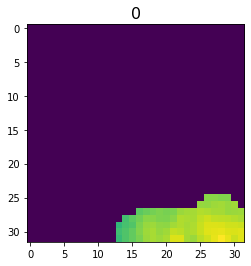

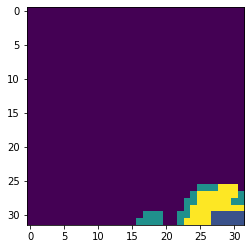

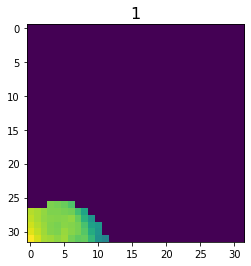

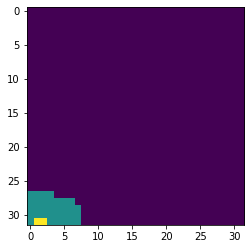

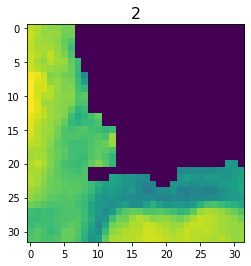

...

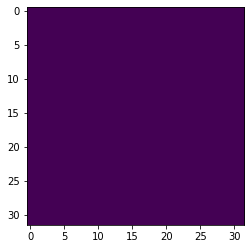

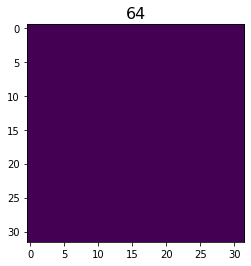

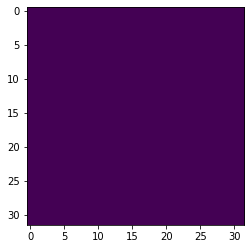

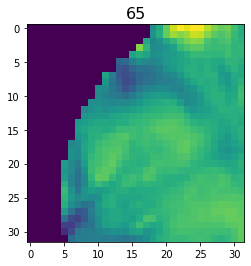

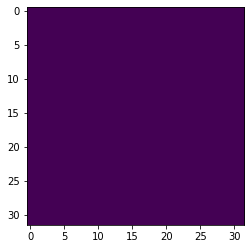

In [65]:
import matplotlib.pyplot as plt

print(arr_data.shape,arr_gt.shape)

for f in range(arr_data.shape[0]):

      plt.title(f, fontsize=16)
      plt.imshow(arr_data[f,15,:,:,1])
      plt.show()
      plt.imshow(arr_gt[f,15,:,:])
      plt.show()

### Patch visszaalakítás

In [116]:
data = 'Diploma_munka/patch_data.npy'
gt = 'Diploma_munka/patch_gt.npy'

back_patch(24,32,32,144,192,192,6,gt)
np.save('Diploma_munka/patch_gt_back.npy',back_patch)
back_patch_data(24,32,32,144,192,192,6,data)
np.save('Diploma_munka/patch_data_back.npy',back_patch_data)


(216, 24, 32, 32)
(5184, 32, 32)
24
32
32
144
192
192
1
(1, 216, 24, 32, 32)
(1, 6, 36, 24, 32, 32)
(1, 6, 6, 6, 24, 32, 32)
(1, 6, 24, 6, 32, 6, 32)
(1, 144, 6, 32, 6, 32)
(1, 144, 192, 6, 32)
(1, 144, 192, 192)
(216, 24, 32, 32, 4)
(5184, 32, 32, 4)
24
32
32
144
192
192
1
(1, 216, 24, 32, 32, 4)
(1, 6, 36, 24, 32, 32, 4)
(1, 6, 6, 6, 24, 32, 32, 4)
(1, 6, 24, 6, 32, 6, 32, 4)
(1, 144, 6, 32, 6, 32, 4)
(1, 144, 192, 6, 32, 4)
(1, 144, 192, 192, 4)


### További előfeldolgozás 

In [136]:
data = np.load('Diploma_munka/data_bemutato_pre_reduced_patch_ROI.npy')
gt = np.load('Diploma_munka/gt_bemutato_pre_reduced_patch_ROI.npy')

print(data.shape,gt.shape)

(66, 24, 32, 32, 4) (66, 24, 32, 32)


In [137]:
data = data.reshape([-1,32,32,4]) #így tudjuk szétszedni szeletekre a 3D felvételeket
gt = gt.reshape([-1,32,32,1]) #144 db 192 x 192 kép

print(data.shape,gt.shape)

(1584, 32, 32, 4) (1584, 32, 32, 1)


In [138]:
gt[np.where(gt==4)]=3   #One-hot encoding: 4 -> 3 (3-mas érték a kimenetben 4. osztályként jelenik meg)

In [130]:
from sklearn.model_selection import train_test_split #tömbök felosztása tanítási és validációs részhalmazokra - egy darab 3D -s felvételre is müködik a bemutatóban

X_train, X_val, Y_train, Y_val = train_test_split(data, gt, test_size=0.25,random_state=42)

print(X_train.shape, X_val.shape, Y_train.shape, Y_val.shape)

(1188, 32, 32, 4) (396, 32, 32, 4) (1188, 32, 32, 1) (396, 32, 32, 1)


In [131]:
from tensorflow.keras.utils import to_categorical #a categorical a meglévő osztály vektorokat bináris vektorokká konvertálja
Y_train = to_categorical(Y_train)
Y_val = to_categorical(Y_val)

print(X_val.shape, Y_val.shape)

(396, 32, 32, 4) (396, 32, 32, 4)


In [132]:
np.save('./Diploma_munka/X_train_patch.npy',X_train)
np.save('./Diploma_munka/Y_train_patch.npy',Y_train)
np.save('./Diploma_munka/X_val_patch.npy',X_val)
np.save('./Diploma_munka/Y_val_patch.npy',Y_val)

print(X_train.shape, X_val.shape, Y_train.shape, Y_val.shape)

(1188, 32, 32, 4) (396, 32, 32, 4) (1188, 32, 32, 4) (396, 32, 32, 4)


Number of slice:0


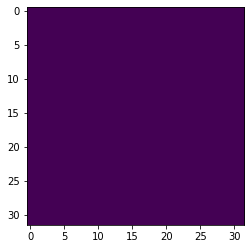

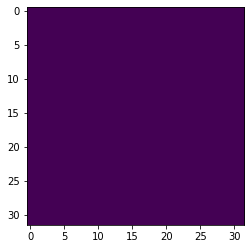

Number of slice:1


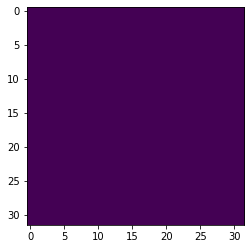

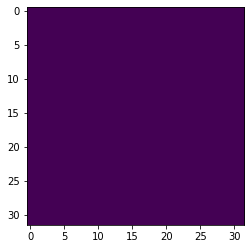

Number of slice:2


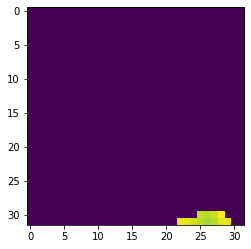

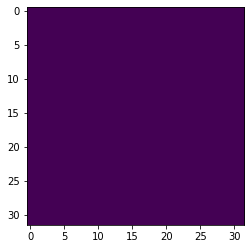

Number of slice:3


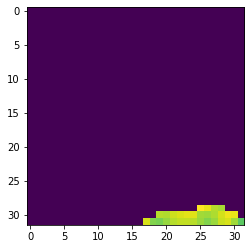

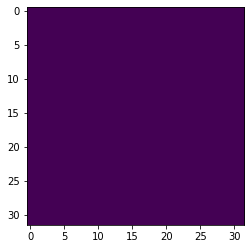

Number of slice:4


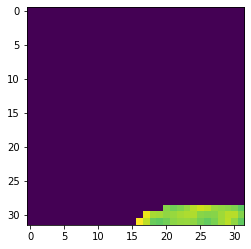

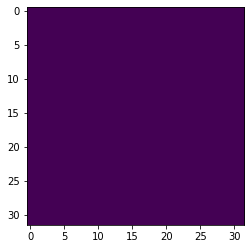

Number of slice:5


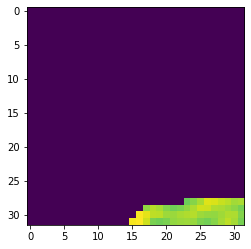

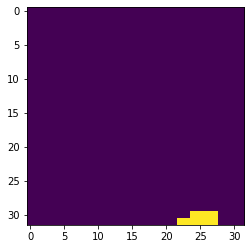

Number of slice:6


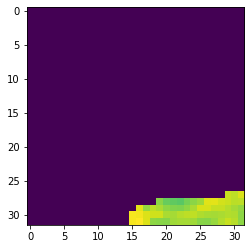

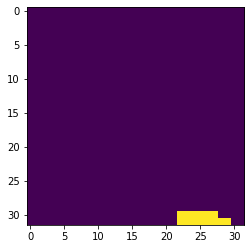

Number of slice:7


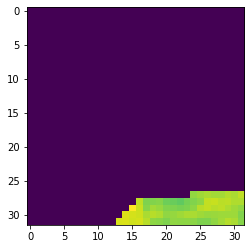

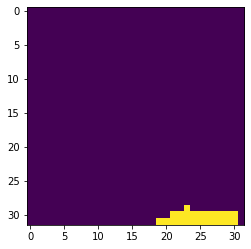

Number of slice:8


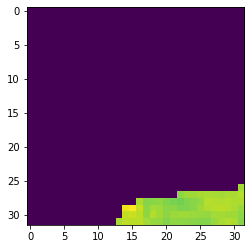

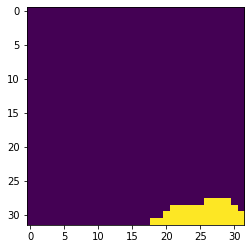

Number of slice:9


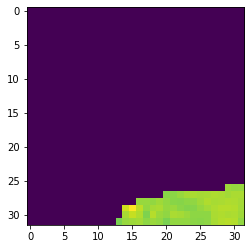

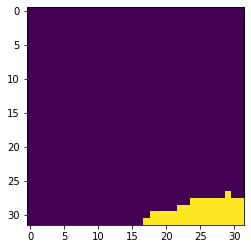

Number of slice:10


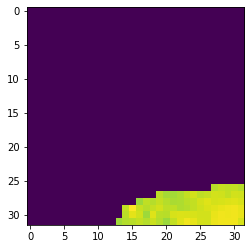

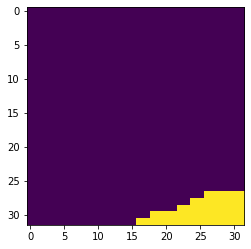

Number of slice:11


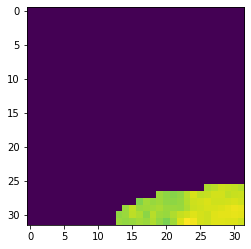

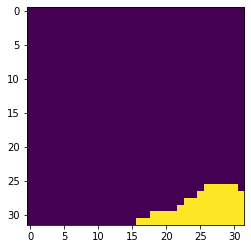

Number of slice:12


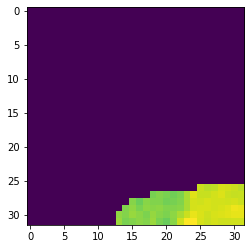

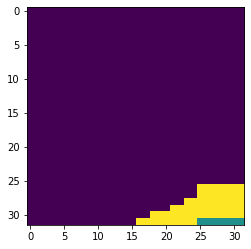

Number of slice:13


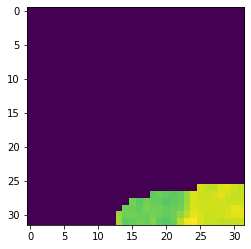

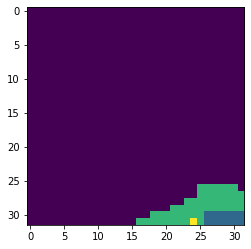

Number of slice:14


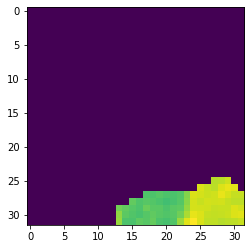

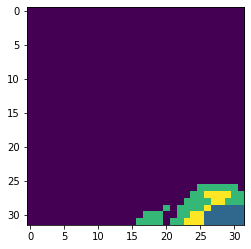

Number of slice:15


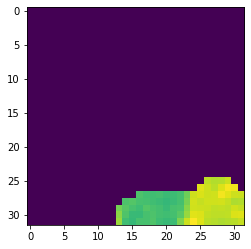

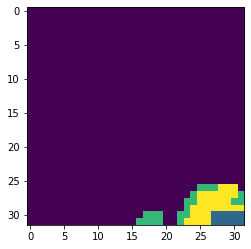

Number of slice:16


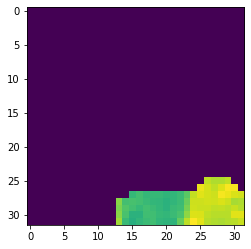

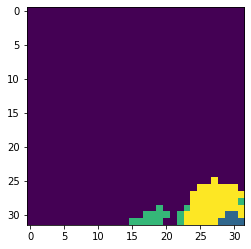

Number of slice:17


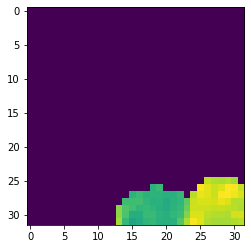

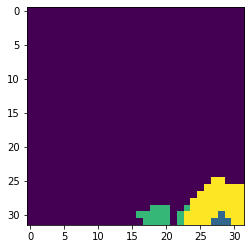

Number of slice:18


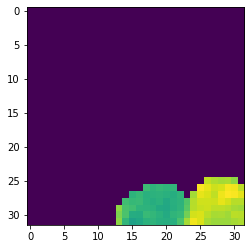

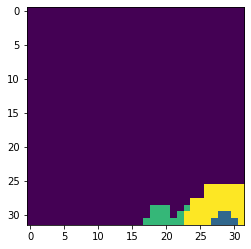

Number of slice:19


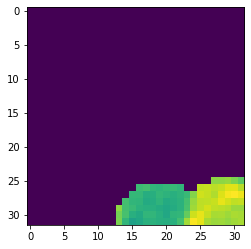

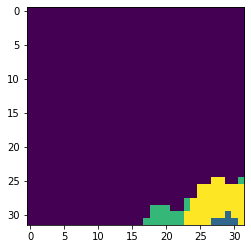

Number of slice:20


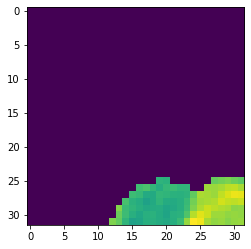

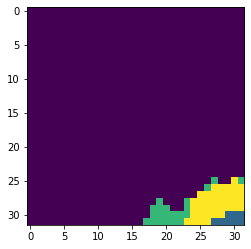

Number of slice:21


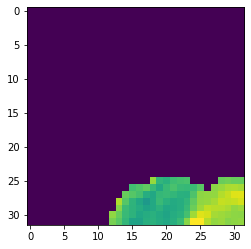

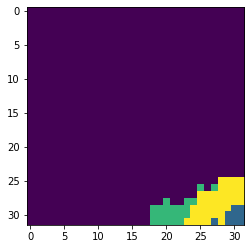

Number of slice:22


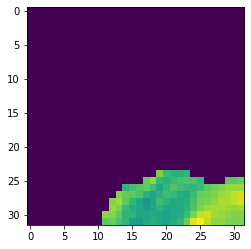

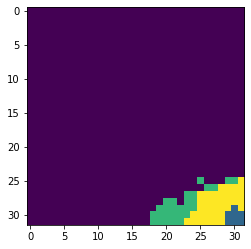

Number of slice:23


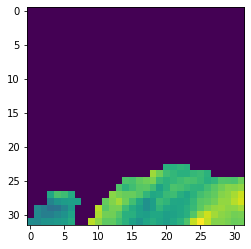

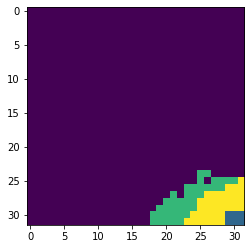

Number of slice:24


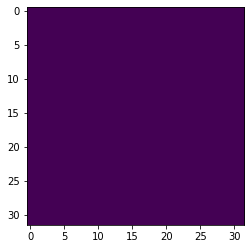

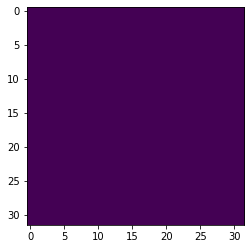

Number of slice:25


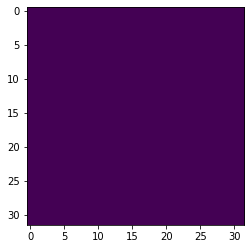

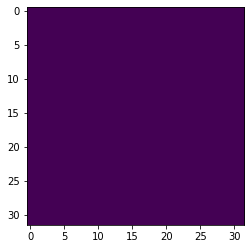

Number of slice:26


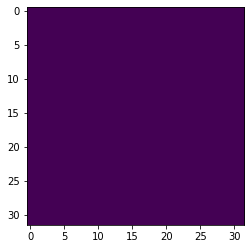

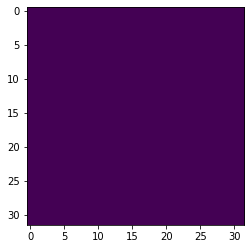

Number of slice:27


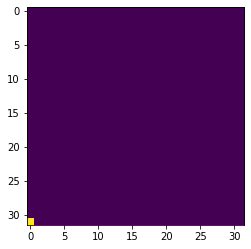

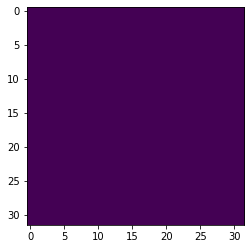

Number of slice:28


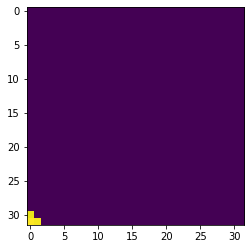

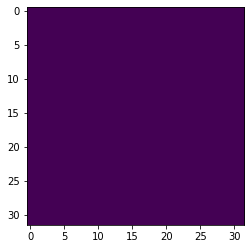

Number of slice:29


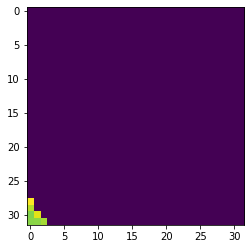

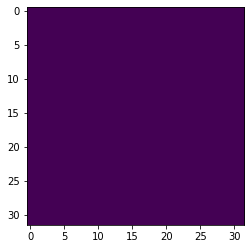

Number of slice:30


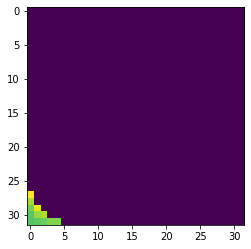

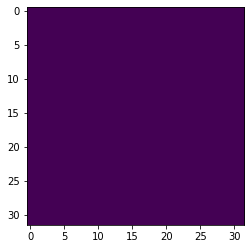

Number of slice:31


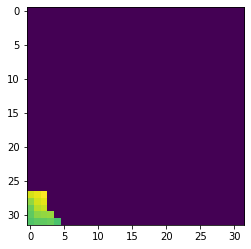

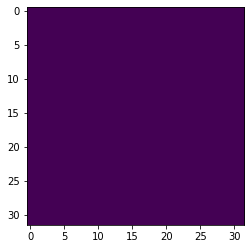

Number of slice:32


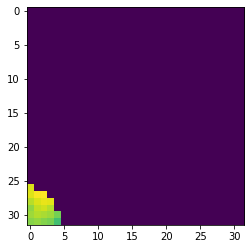

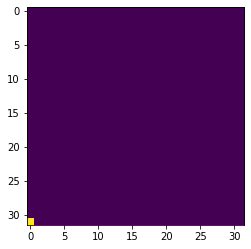

Number of slice:33


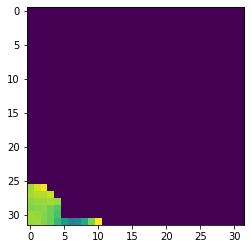

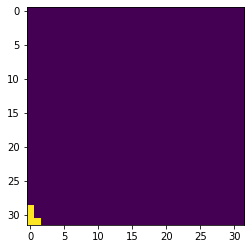

Number of slice:34


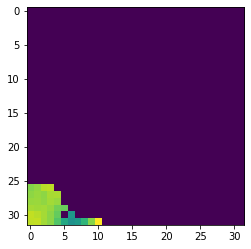

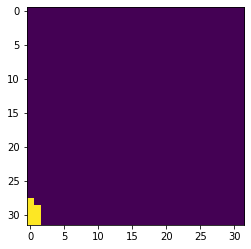

Number of slice:35


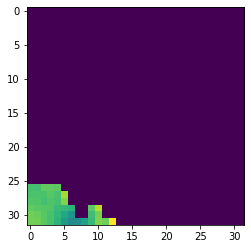

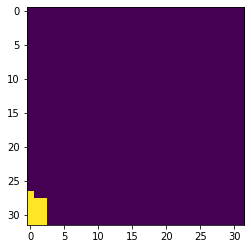

Number of slice:36


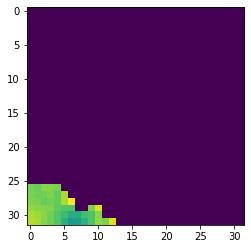

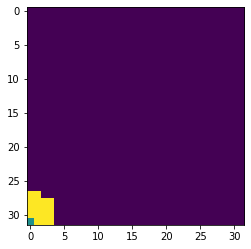

Number of slice:37


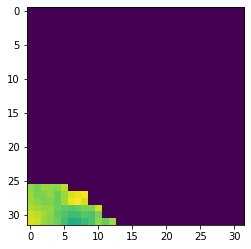

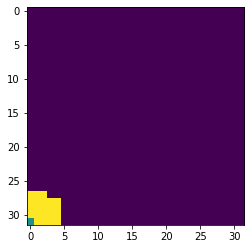

Number of slice:38


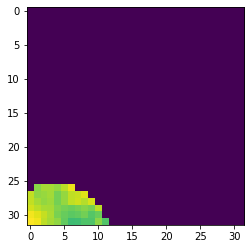

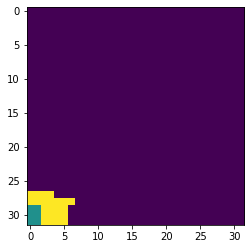

Number of slice:39


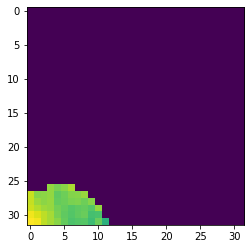

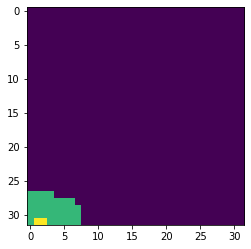

Number of slice:40


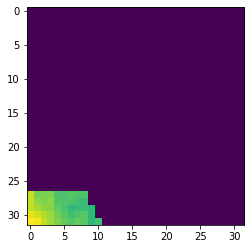

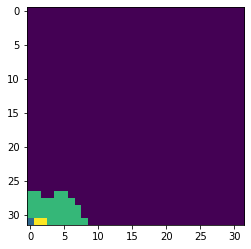

Number of slice:41


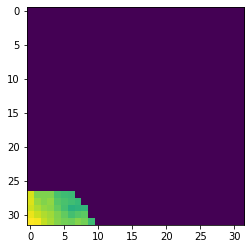

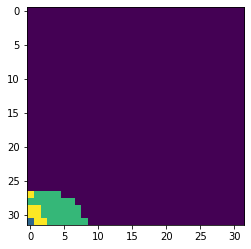

Number of slice:42


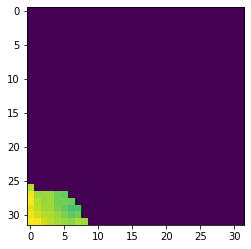

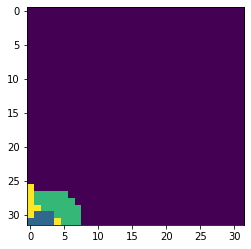

Number of slice:43


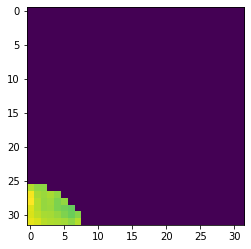

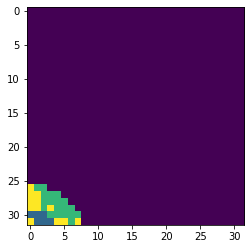

Number of slice:44


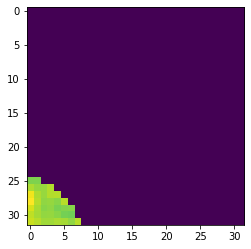

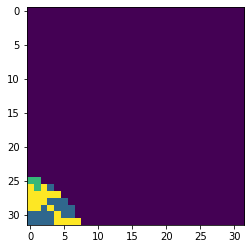

Number of slice:45


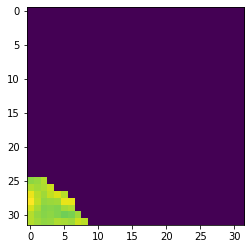

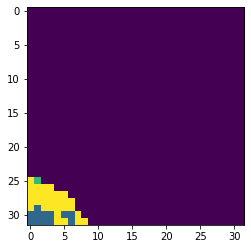

Number of slice:46


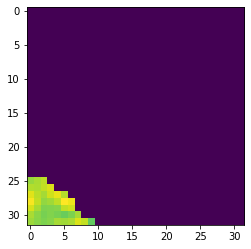

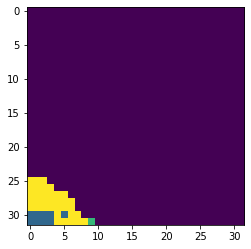

Number of slice:47


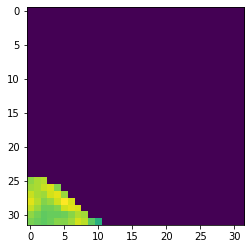

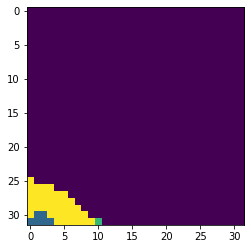

Number of slice:48


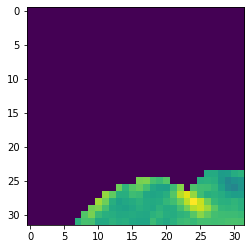

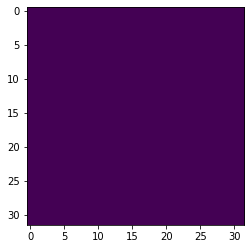

Number of slice:49


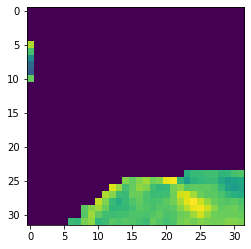

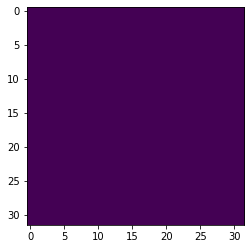

Number of slice:50


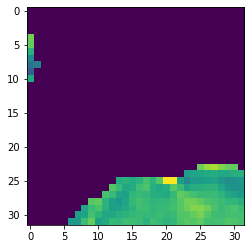

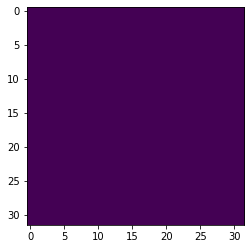

Number of slice:51


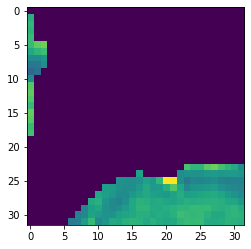

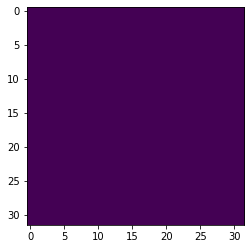

Number of slice:52


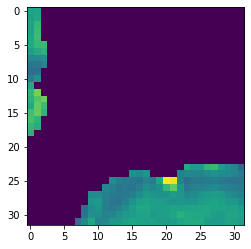

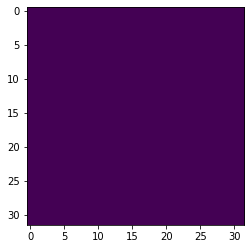

Number of slice:53


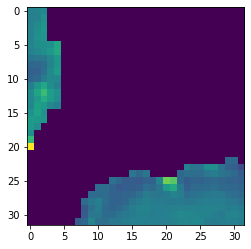

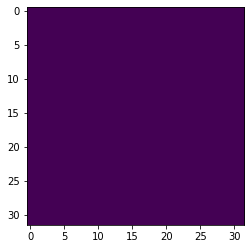

Number of slice:54


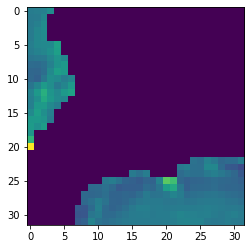

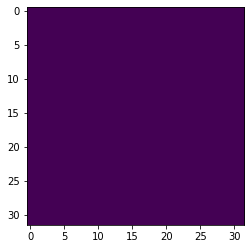

Number of slice:55


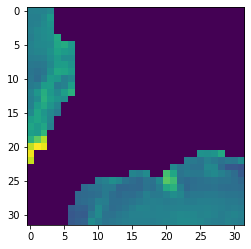

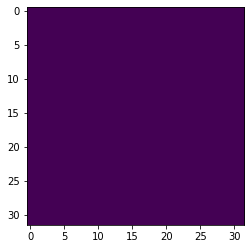

Number of slice:56


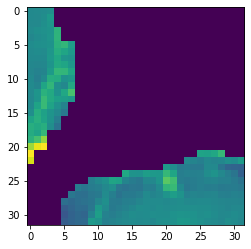

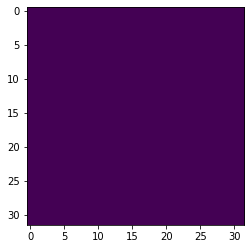

Number of slice:57


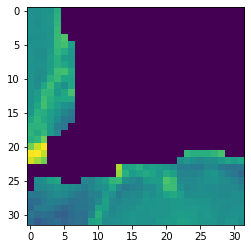

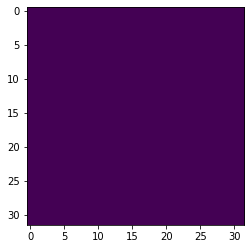

Number of slice:58


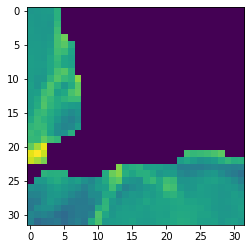

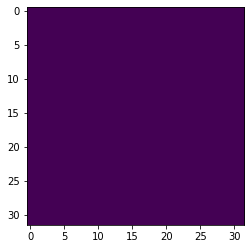

Number of slice:59


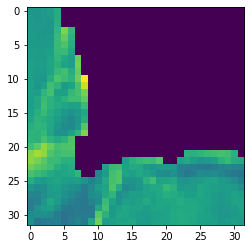

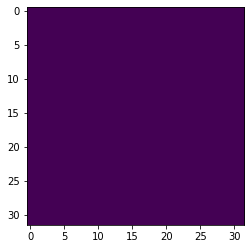

Number of slice:60


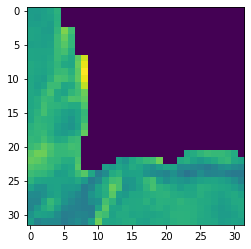

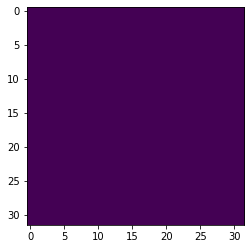

Number of slice:61


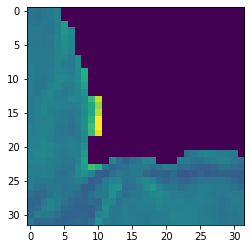

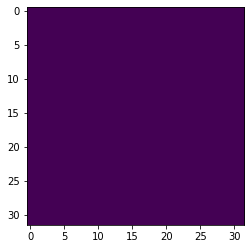

Number of slice:62


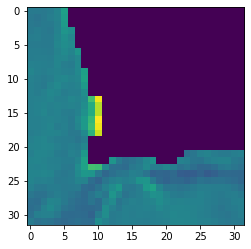

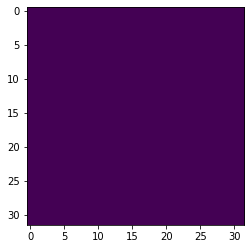

Number of slice:63


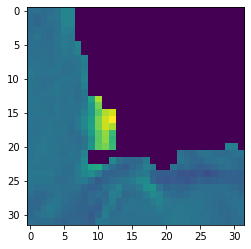

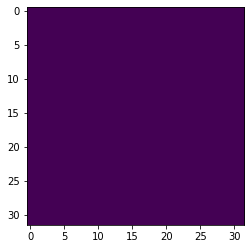

Number of slice:64


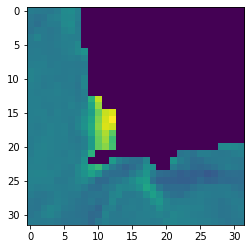

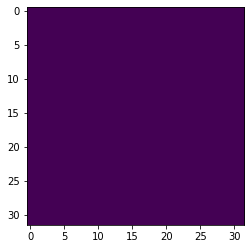

Number of slice:65


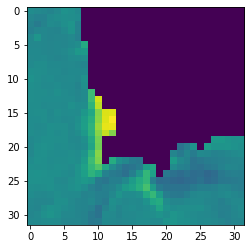

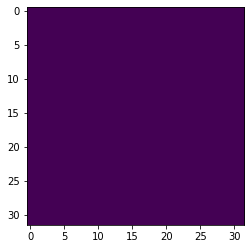

Number of slice:66


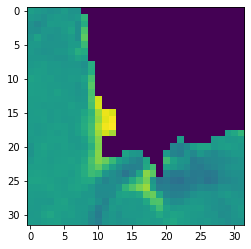

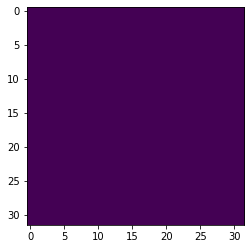

Number of slice:67


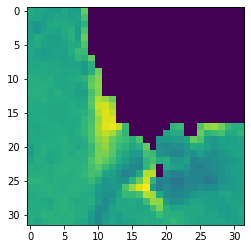

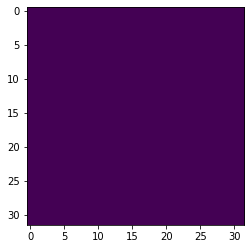

Number of slice:68


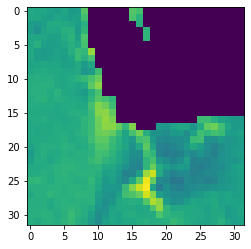

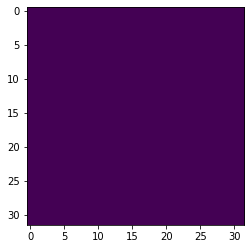

Number of slice:69


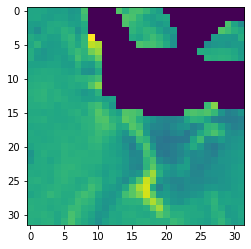

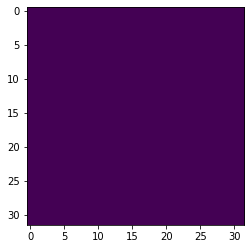

Number of slice:70


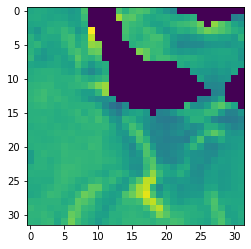

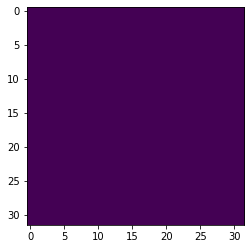

Number of slice:71


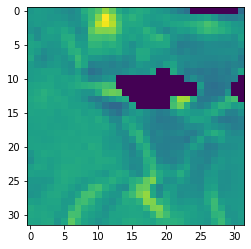

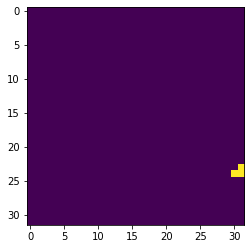

Number of slice:72


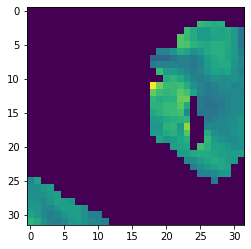

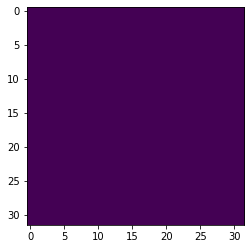

Number of slice:73


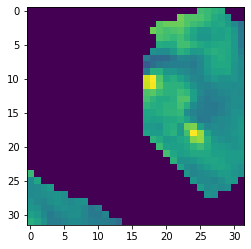

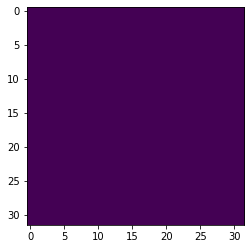

Number of slice:74


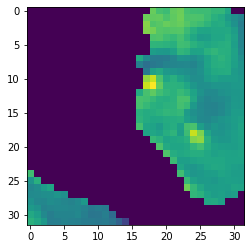

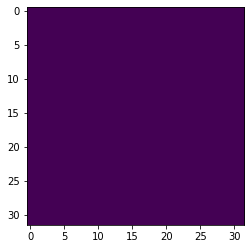

Number of slice:75


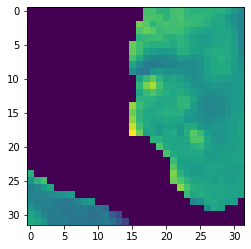

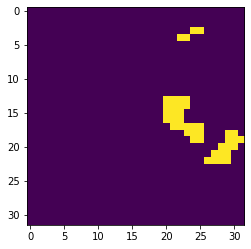

Number of slice:76


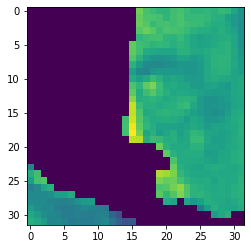

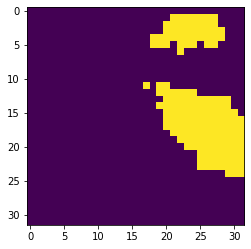

Number of slice:77


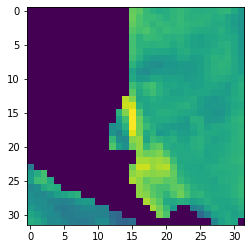

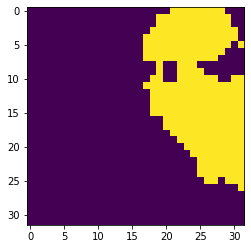

Number of slice:78


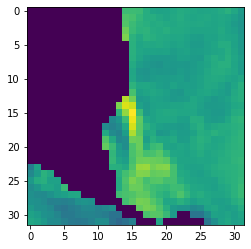

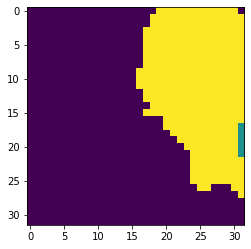

Number of slice:79


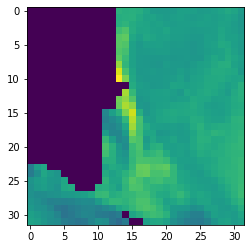

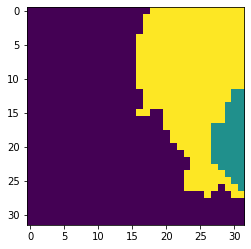

Number of slice:80


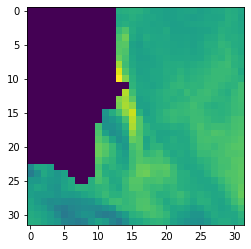

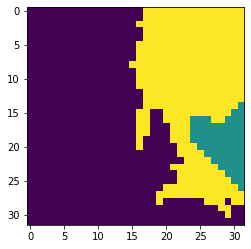

Number of slice:81


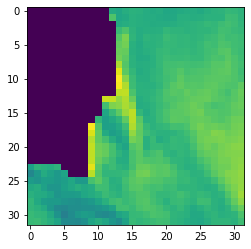

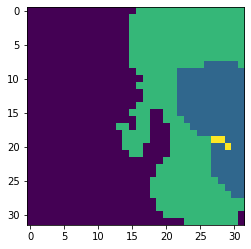

Number of slice:82


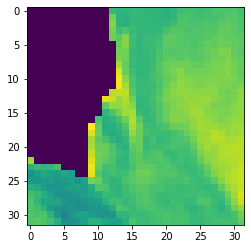

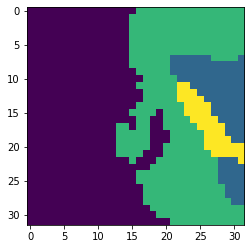

Number of slice:83


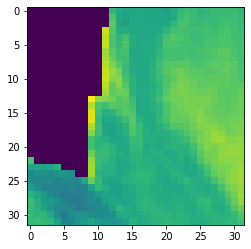

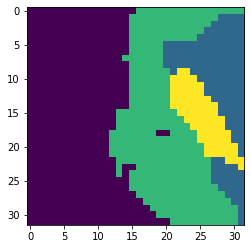

Number of slice:84


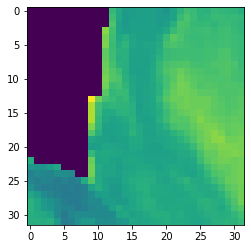

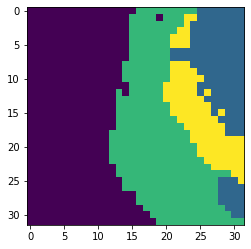

Number of slice:85


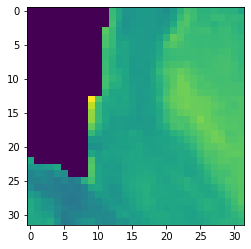

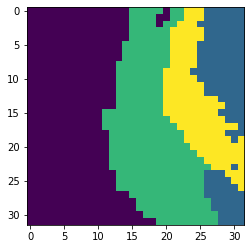

Number of slice:86


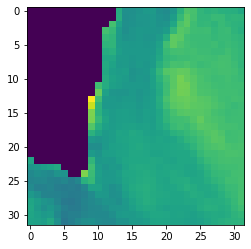

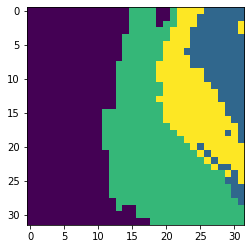

Number of slice:87


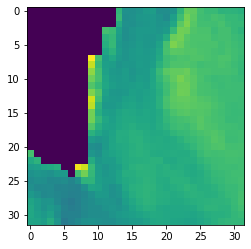

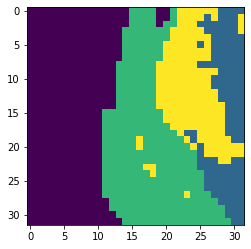

Number of slice:88


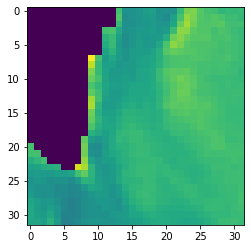

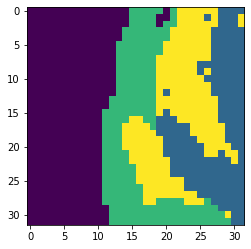

Number of slice:89


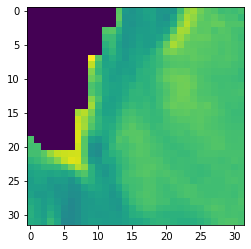

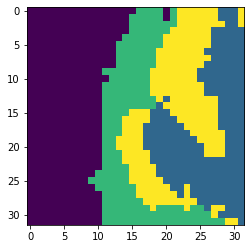

Number of slice:90


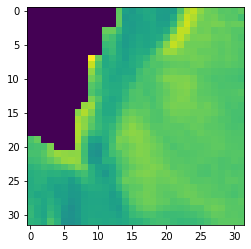

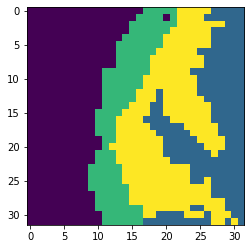

Number of slice:91


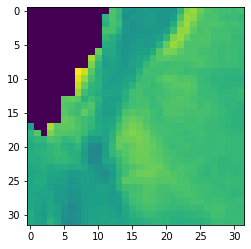

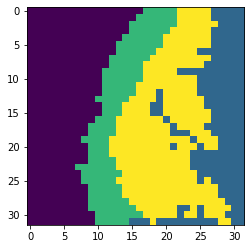

Number of slice:92


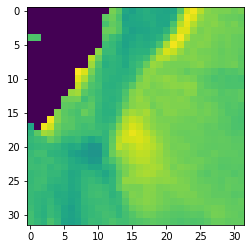

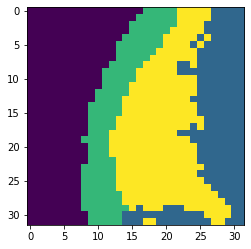

Number of slice:93


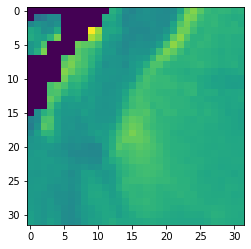

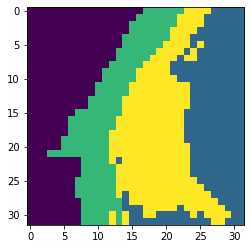

Number of slice:94


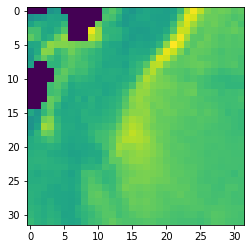

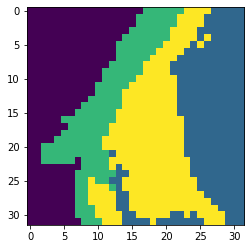

Number of slice:95


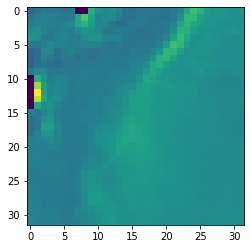

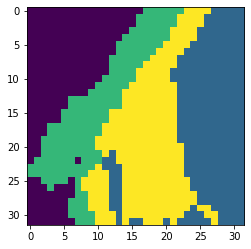

Number of slice:96


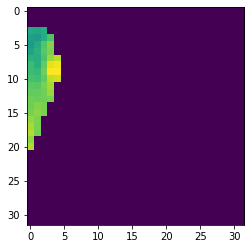

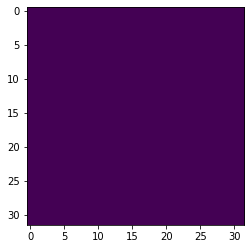

Number of slice:97


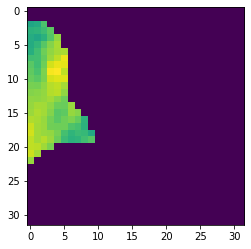

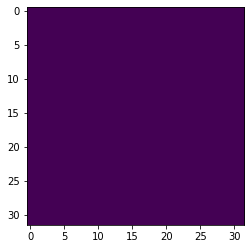

Number of slice:98


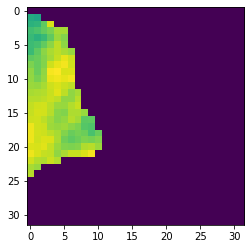

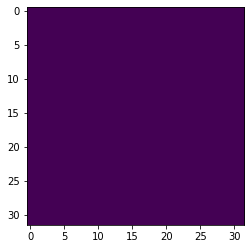

Number of slice:99


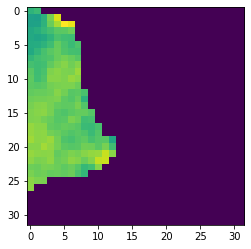

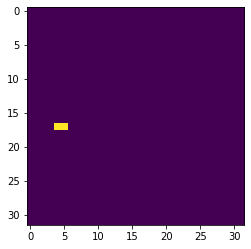

Number of slice:100


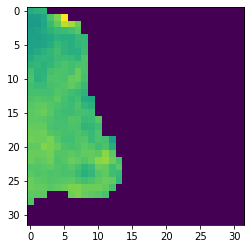

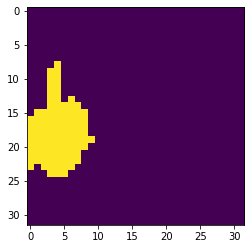

Number of slice:101


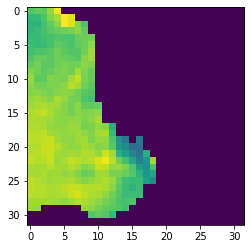

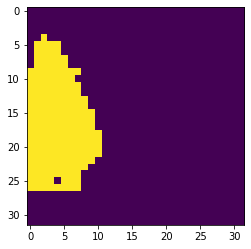

Number of slice:102


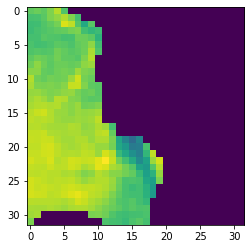

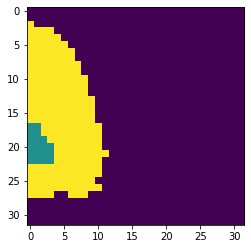

Number of slice:103


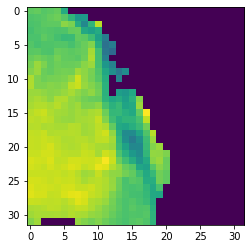

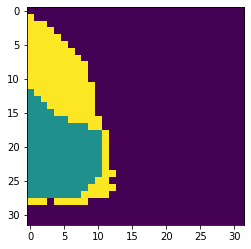

Number of slice:104


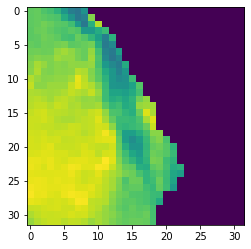

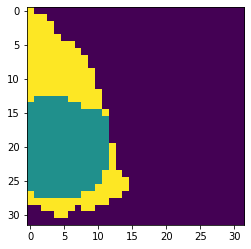

Number of slice:105


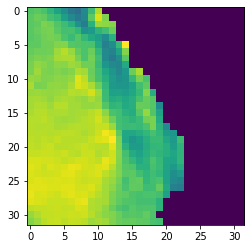

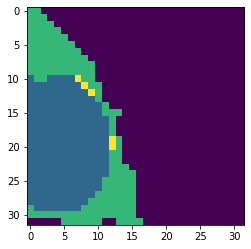

Number of slice:106


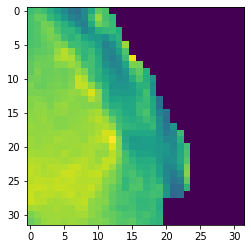

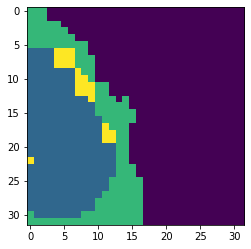

Number of slice:107


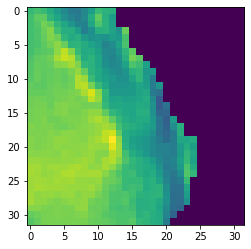

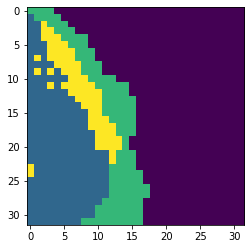

Number of slice:108


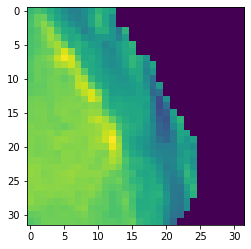

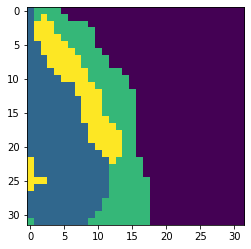

Number of slice:109


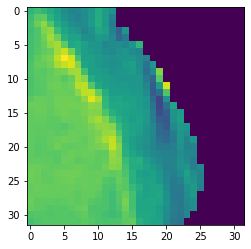

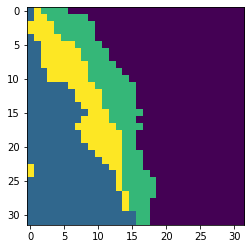

Number of slice:110


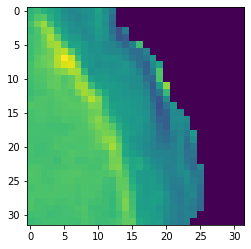

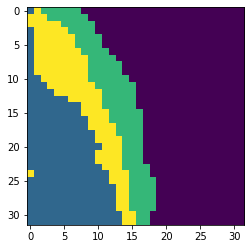

Number of slice:111


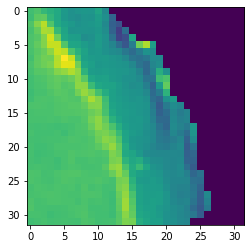

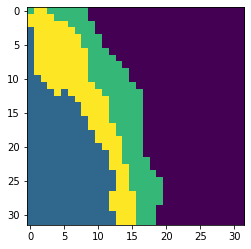

Number of slice:112


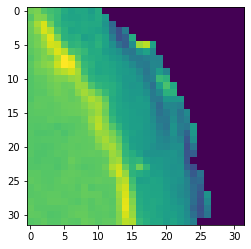

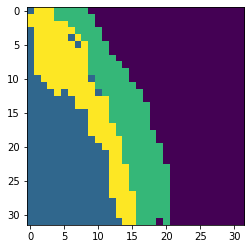

Number of slice:113


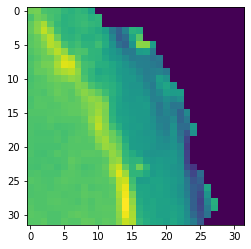

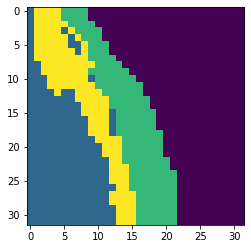

Number of slice:114


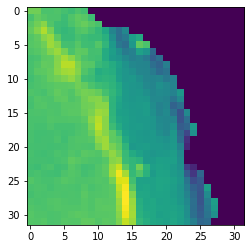

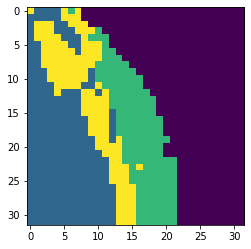

Number of slice:115


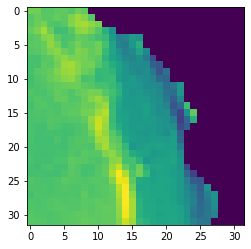

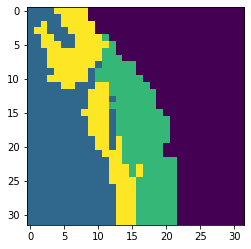

Number of slice:116


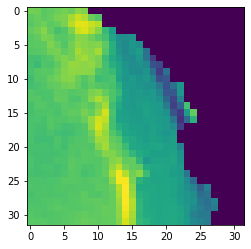

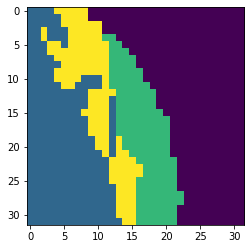

Number of slice:117


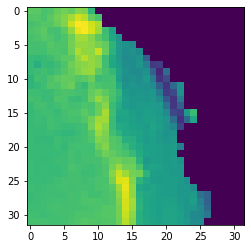

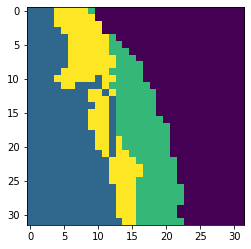

Number of slice:118


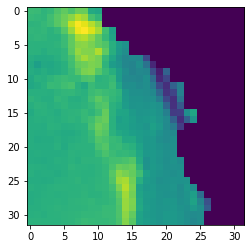

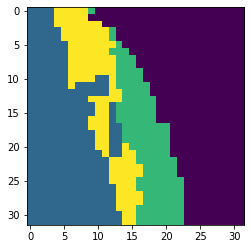

Number of slice:119


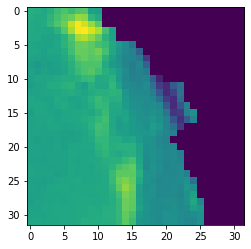

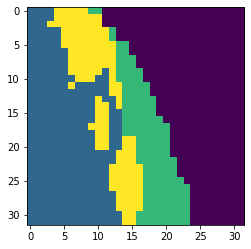

Number of slice:120


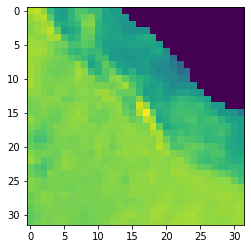

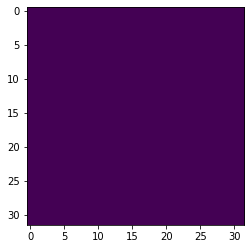

Number of slice:121


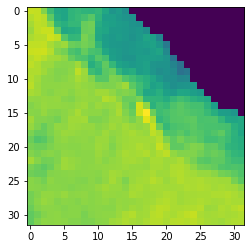

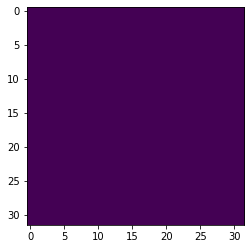

Number of slice:122


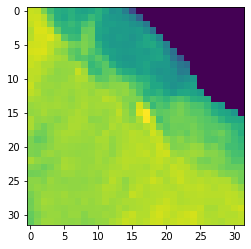

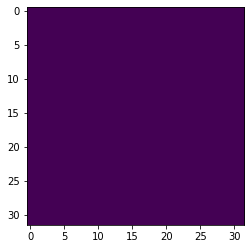

Number of slice:123


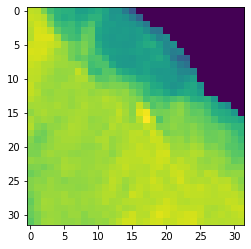

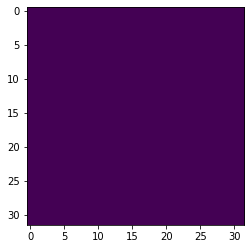

Number of slice:124


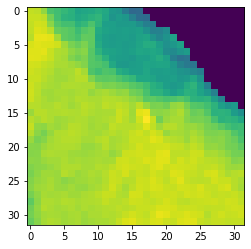

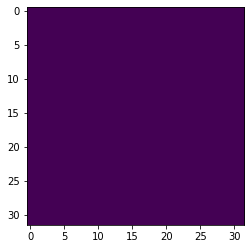

Number of slice:125


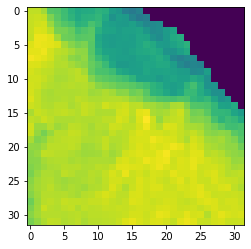

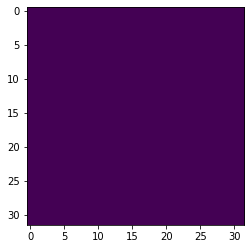

Number of slice:126


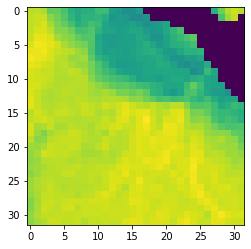

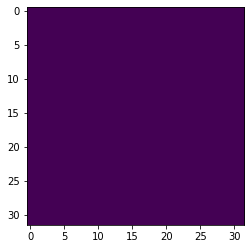

Number of slice:127


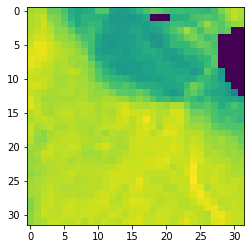

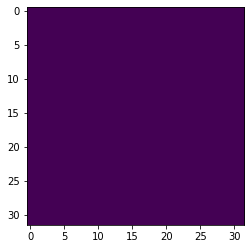

Number of slice:128


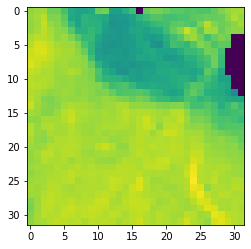

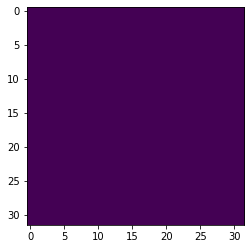

Number of slice:129


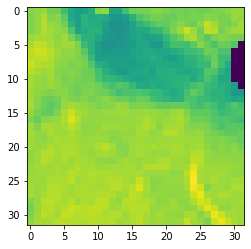

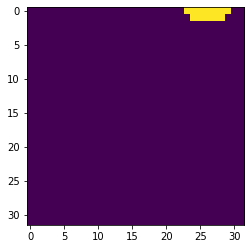

Number of slice:130


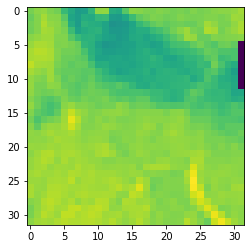

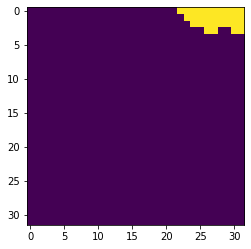

Number of slice:131


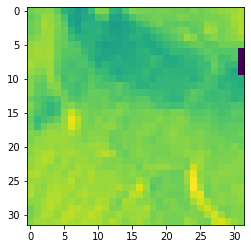

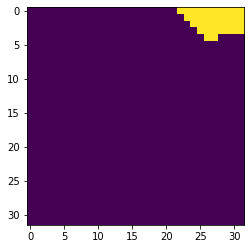

Number of slice:132


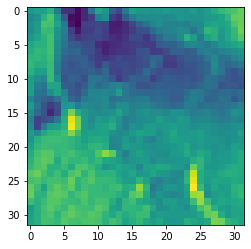

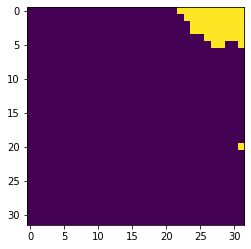

Number of slice:133


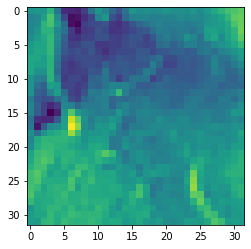

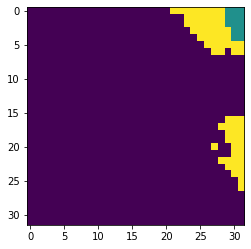

Number of slice:134


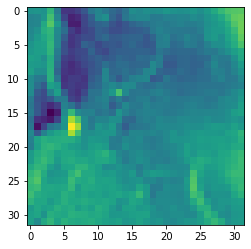

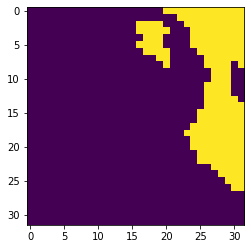

Number of slice:135


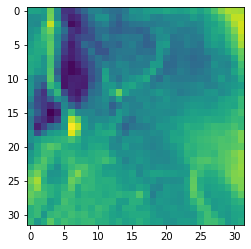

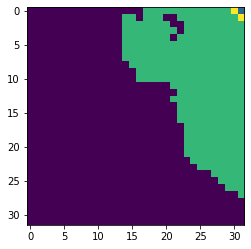

Number of slice:136


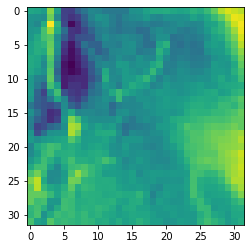

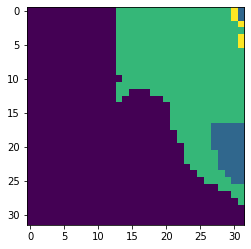

Number of slice:137


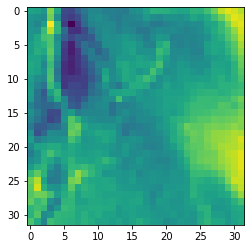

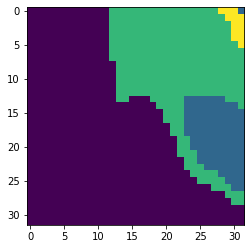

Number of slice:138


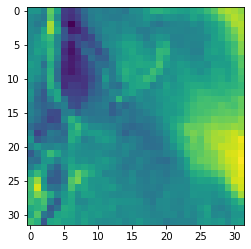

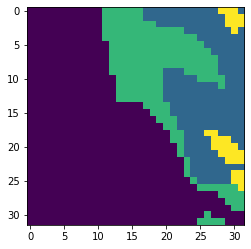

Number of slice:139


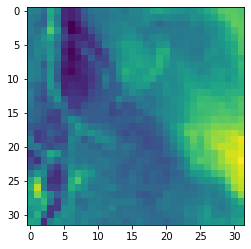

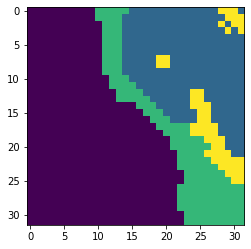

Number of slice:140


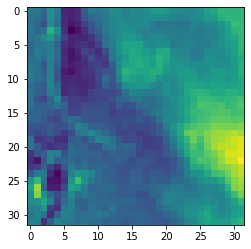

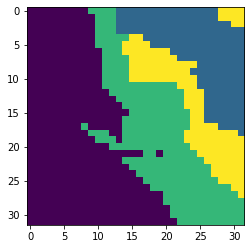

Number of slice:141


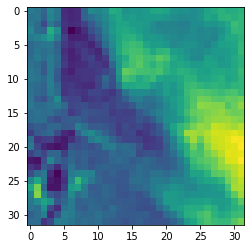

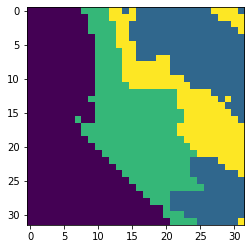

Number of slice:142


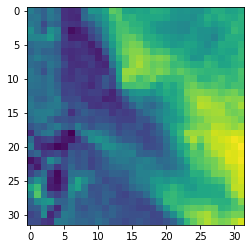

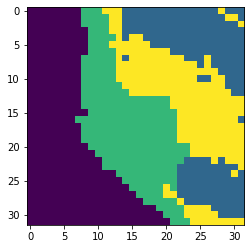

Number of slice:143


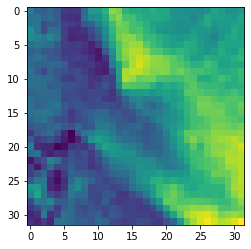

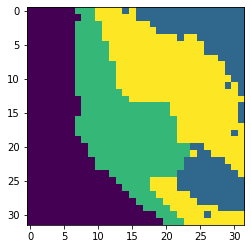

In [140]:
import matplotlib.pyplot as plt
for i in range(0,144):
  print('Number of slice:' + str(i))
  plt.imshow(data[i,:,:,2])
  plt.show()
  plt.imshow(gt[i,:,:,0])
  plt.show()


# Hálók

In [ ]:
from keras.models import Model
from keras.layers import MaxPooling2D,Conv2D,Dense,BatchNormalization,concatenate,Input,Dropout,Maximum,Activation,Dense,Flatten,UpSampling2D,Conv2DTranspose
from keras.optimizers import SGD,Adam,RMSprop
import keras.callbacks as callbacks
import keras.initializers as initializers
from keras.callbacks import Callback
from keras import regularizers

## U-Net


In [ ]:
############################################ U-net #############################################

############ Encoder #############
input_ = Input(shape=(192,192,4),name='input')                                              

block1_conv1 = Conv2D(64,3,padding='same',activation='relu',name='block1_conv1')(input_)
block1_conv2 = Conv2D(64,3,padding='same',activation='relu',name='block1_conv2')(block1_conv1)
block1_norm = BatchNormalization(name='block1_batch_norm')(block1_conv2)
block1_pool = MaxPooling2D(name='block1_pool')(block1_norm)

block2_conv1 = Conv2D(128,3,padding='same',activation='relu',name='block2_conv1')(block1_pool)
block2_conv2 = Conv2D(128,3,padding='same',activation='relu',name='block2_conv2')(block2_conv1)
block2_norm = BatchNormalization(name='block2_batch_norm')(block2_conv2)
block2_pool = MaxPooling2D(name='block2_pool')(block2_norm)

encoder_dropout_1 = Dropout(0.2,name='encoder_dropout_1')(block2_pool)

block3_conv1 = Conv2D(256,3,padding='same',activation='relu',name='block3_conv1')(encoder_dropout_1)
block3_conv2 = Conv2D(256,3,padding='same',activation='relu',name='block3_conv2')(block3_conv1)
block3_norm = BatchNormalization(name='block3_batch_norm')(block3_conv2)
block3_pool = MaxPooling2D(name='block3_pool')(block3_norm)

block4_conv1 = Conv2D(512,3,padding='same',activation='relu',name='block4_conv1')(block3_pool)
block4_conv2 = Conv2D(512,3,padding='same',activation='relu',name='block4_conv2')(block4_conv1)
block4_norm = BatchNormalization(name='block4_batch_norm')(block4_conv2)
block4_pool = MaxPooling2D(name='block4_pool')(block4_norm)
################### Encoder end ######################

block5_conv1 = Conv2D(1024,3,padding='same',activation='relu',name='block5_conv1')(block4_pool)


########### Decoder ################

up_pool1 = Conv2DTranspose(1024,3,strides = (2, 2),padding='same',activation='relu',name='up_pool1')(block5_conv1)
merged_block1 = concatenate([block4_norm,up_pool1],name='merged_block1')
decod_block1_conv1 = Conv2D(512,3, padding = 'same', activation='relu',name='decod_block1_conv1')(merged_block1)

up_pool2 = Conv2DTranspose(512,3,strides = (2, 2),padding='same',activation='relu',name='up_pool2')(decod_block1_conv1)
merged_block2 = concatenate([block3_norm,up_pool2],name='merged_block2')
decod_block2_conv1 = Conv2D(256,3,padding = 'same',activation='relu',name='decod_block2_conv1')(merged_block2)

decoder_dropout_1 = Dropout(0.2,name='decoder_dropout_1')(decod_block2_conv1)

up_pool3 = Conv2DTranspose(256,3,strides = (2, 2),padding='same',activation='relu',name='up_pool3')(decoder_dropout_1)
merged_block3 = concatenate([block2_norm,up_pool3],name='merged_block3')
decod_block3_conv1 = Conv2D(128,3,padding = 'same',activation='relu',name='decod_block3_conv1')(merged_block3)

up_pool4 = Conv2DTranspose(128,3,strides = (2, 2),padding='same',activation='relu',name='up_pool4')(decod_block3_conv1)
merged_block4 = concatenate([block1_norm,up_pool4],name='merged_block4')
decod_block4_conv1 = Conv2D(64,3,padding = 'same',activation='relu',name='decod_block4_conv1')(merged_block4)
############ Decoder End ######################################


pre_output = Conv2D(64,1,padding = 'same',activation='relu',name='pre_output')(decod_block4_conv1)

output = Conv2D(4,1,padding='same',activation='softmax',name='output')(pre_output)

model = Model(inputs = input_, outputs = output)
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, 192, 192, 4) 0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 192, 192, 64) 2368        input[0][0]                      
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 192, 192, 64) 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_batch_norm (BatchNormali (None, 192, 192, 64) 256         block1_conv2[0][0]               
____________________________________________________________________________________________

## U-Net 2D-s patch-ekhez


In [ ]:
############################################ U-net #############################################

############ Encoder #############
input_ = Input(shape=(32,32,4),name='input')                                              

block1_conv1 = Conv2D(16,3,padding='same',activation='relu',name='block1_conv1')(input_)
block1_conv2 = Conv2D(16,3,padding='same',activation='relu',name='block1_conv2')(block1_conv1)
block1_norm = BatchNormalization(name='block1_batch_norm')(block1_conv2)
block1_pool = MaxPooling2D(name='block1_pool')(block1_norm)

block2_conv1 = Conv2D(32,3,padding='same',activation='relu',name='block2_conv1')(block1_pool)
block2_conv2 = Conv2D(32,3,padding='same',activation='relu',name='block2_conv2')(block2_conv1)
block2_norm = BatchNormalization(name='block2_batch_norm')(block2_conv2)
block2_pool = MaxPooling2D(name='block2_pool')(block2_norm)


block3_conv1 = Conv2D(64,3,padding='same',activation='relu',name='block3_conv1')(block2_pool)
block3_conv2 = Conv2D(64,3,padding='same',activation='relu',name='block3_conv2')(block3_conv1)
block3_norm = BatchNormalization(name='block3_batch_norm')(block3_conv2)
block3_pool = MaxPooling2D(name='block3_pool')(block3_norm)

block4_conv1 = Conv2D(128,3,padding='same',activation='relu',name='block4_conv1')(block3_pool)
block4_conv2 = Conv2D(128,3,padding='same',activation='relu',name='block4_conv2')(block4_conv1)
block4_norm = BatchNormalization(name='block4_batch_norm')(block4_conv2)
block4_pool = MaxPooling2D(name='block4_pool')(block4_norm)
################### Encoder end ######################

block5_conv1 = Conv2D(256,3,padding='same',activation='relu',name='block5_conv1')(block4_pool)


########### Decoder ################

up_pool1 = Conv2DTranspose(256,3,strides = (2, 2),padding='same',activation='relu',name='up_pool1')(block5_conv1)
merged_block1 = concatenate([block4_norm,up_pool1],name='merged_block1')
decod_block1_conv1 = Conv2D(128,3, padding = 'same', activation='relu',name='decod_block1_conv1')(merged_block1)

up_pool2 = Conv2DTranspose(128,3,strides = (2, 2),padding='same',activation='relu',name='up_pool2')(decod_block1_conv1)
merged_block2 = concatenate([block3_norm,up_pool2],name='merged_block2')
decod_block2_conv1 = Conv2D(64,3,padding = 'same',activation='relu',name='decod_block2_conv1')(merged_block2)


up_pool3 = Conv2DTranspose(64,3,strides = (2, 2),padding='same',activation='relu',name='up_pool3')(decod_block2_conv1)
merged_block3 = concatenate([block2_norm,up_pool3],name='merged_block3')
decod_block3_conv1 = Conv2D(32,3,padding = 'same',activation='relu',name='decod_block3_conv1')(merged_block3)

up_pool4 = Conv2DTranspose(32,3,strides = (2, 2),padding='same',activation='relu',name='up_pool4')(decod_block3_conv1)
merged_block4 = concatenate([block1_norm,up_pool4],name='merged_block4')
decod_block4_conv1 = Conv2D(16,3,padding = 'same',activation='relu',name='decod_block4_conv1')(merged_block4)
############ Decoder End ######################################


pre_output = Conv2D(16,1,padding = 'same',activation='relu',name='pre_output')(decod_block4_conv1)

output = Conv2D(4,1,padding='same',activation='softmax',name='output')(pre_output)

model = Model(inputs = input_, outputs = output)
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input (InputLayer)              [(None, 32, 32, 4)]  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, 32, 32, 16)   592         input[0][0]                      
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, 32, 32, 16)   2320        block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_batch_norm (BatchNormali (None, 32, 32, 16)   64          block1_conv2[0][0]               
______________________________________________________________________________________________

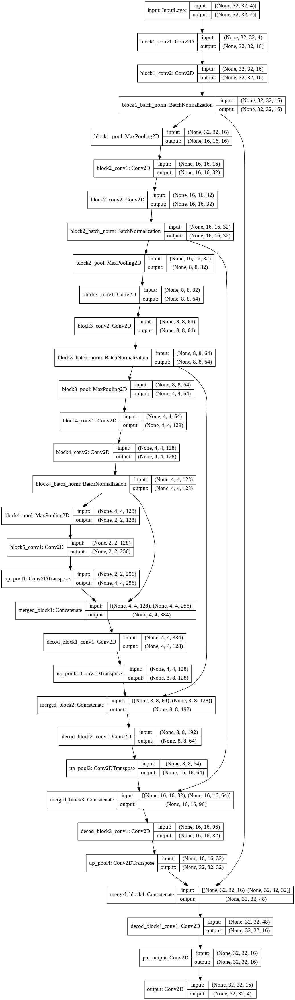

In [ ]:
from keras.utils import  plot_model
plot_model(model,to_file='unet.png',show_shapes=True)

## Modell struktúra

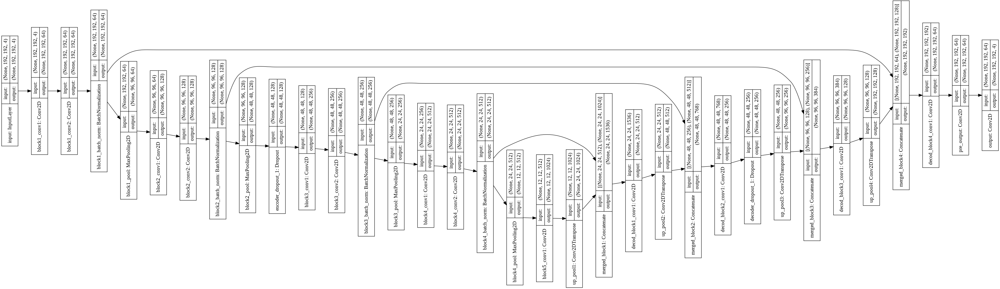

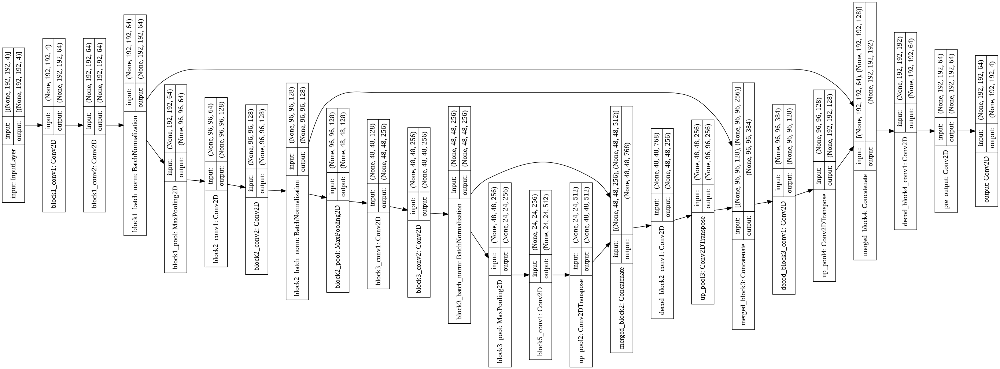


In [ ]:
from keras.utils import  plot_model
plot_model(model,to_file='model.png',show_shapes=True)

# Tanítás

## Adatok betöltése

In [ ]:
X_train = np.load('./elérési mappa/X_tanítóadat.npy')
Y_train = np.load('./elérési mappa/Y_tanítóadat.npy')

X_val = np.load('./elérési mappa/X_validációsadat.npy')
Y_val = np.load('./elérési mappa/Y_validációsadat.npy')

## Loss - függvény definiálása 

In [ ]:
from keras import backend as K
def dice_coef(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    return (2. * intersection) / (K.sum(K.square(y_true),axis=-1) + K.sum(K.square(y_pred),axis=-1) + epsilon)

def dice_coef_loss(y_true, y_pred):
    return 1-dice_coef(y_true, y_pred)

## Model betöltése, learning rate beállítás, súlyok mentése / betöltése, checkpointok létrehozása

In [ ]:
model.compile(optimizer=Adam(lr=1e-5),loss=dice_coef_loss,metrics=[dice_coef])
#model.load_weights('./elérési mappa/súlyok.hdf5') #ha több részletben adjuk be a tanító adatokat akkor ezt az első adag után be kell tölteni
checkpointer = callbacks.ModelCheckpoint(filepath = './elérési elérési/súlyok.hdf5',save_best_only=True)
training_log = callbacks.TensorBoard(log_dir='./elérési log mappa/')

## Tanítás indítása és modell mentése

In [ ]:
history = model.fit(X_train,Y_train,validation_data=(X_val,Y_val),batch_size=32,epochs=100,callbacks=[training_log,checkpointer],shuffle=True)

print("Tanítás vége")

model.save('./elérési mappa modell/model.h5',overwrite=True)

print("Modell paraméterek mentve!")

## History összegzése - 125 epoch 190 tanító kép

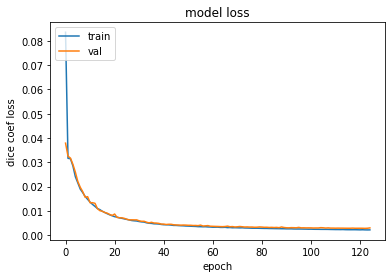

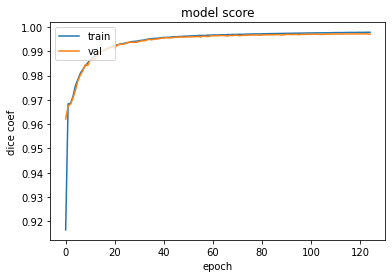

In [ ]:
# summarize history for loss
import matplotlib.pyplot as plt
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('dice coef loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
plt.plot(history.history['dice_coef'])
plt.plot(history.history['val_dice_coef'])
plt.title('model score')
plt.ylabel('dice coef')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

## History összegzése - 75 epoch 299 db tanító lép

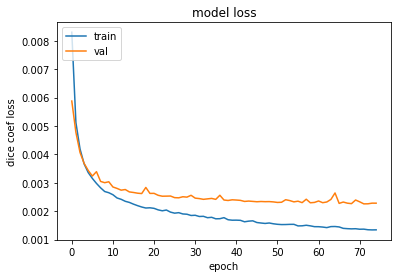

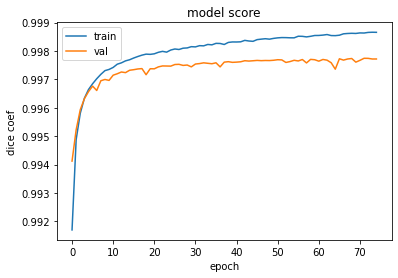

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('dice coef loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
plt.plot(history.history['dice_coef'])
plt.plot(history.history['val_dice_coef'])
plt.title('model score')
plt.ylabel('dice coef')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

## History összegzése - 125 epoch 299 db tanító kép

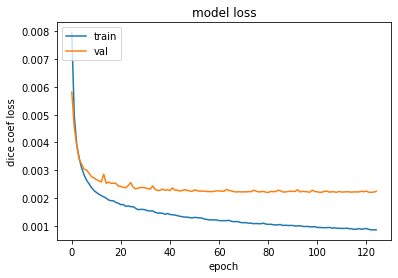

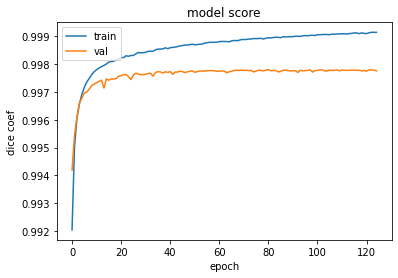

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('dice coef loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
plt.plot(history.history['dice_coef'])
plt.plot(history.history['val_dice_coef'])
plt.title('model score')
plt.ylabel('dice coef')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

## History összegzése - 100 epoch patch

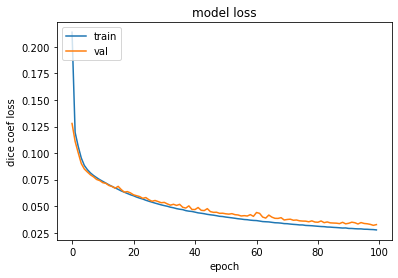

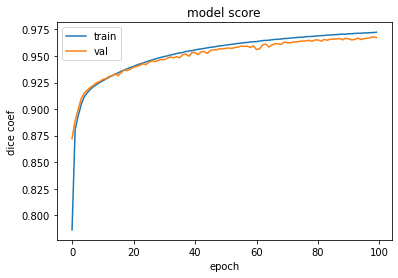

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('dice coef loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
plt.plot(history.history['dice_coef'])
plt.plot(history.history['val_dice_coef'])
plt.title('model score')
plt.ylabel('dice coef')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

# Tesztelés

## Legnagyobb öszefüggő komponens


1.   Label kép konvertálása bináris képpé.
2.   Legnagyobb összefüggő komponens megtalálása
3.   Maradék törlése.
4.   Az így megkapott kép és az eredeti fúziója, ezzel visszakpva az eredeti címkéket.






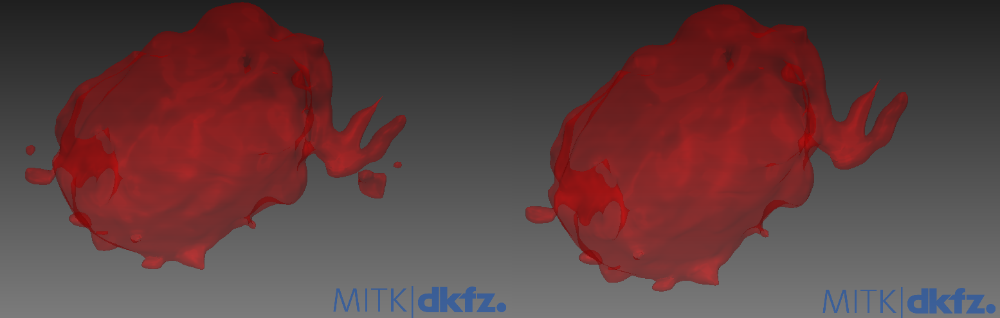

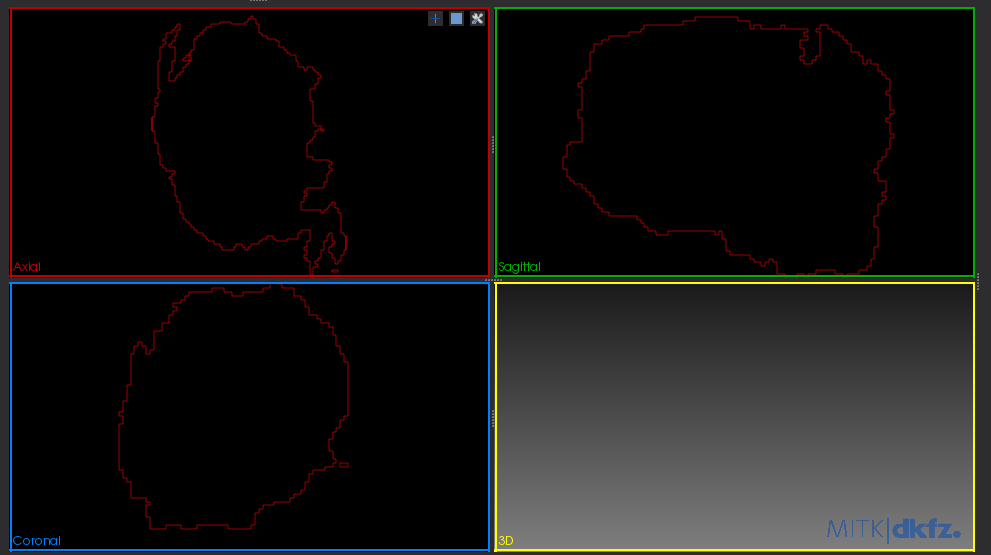

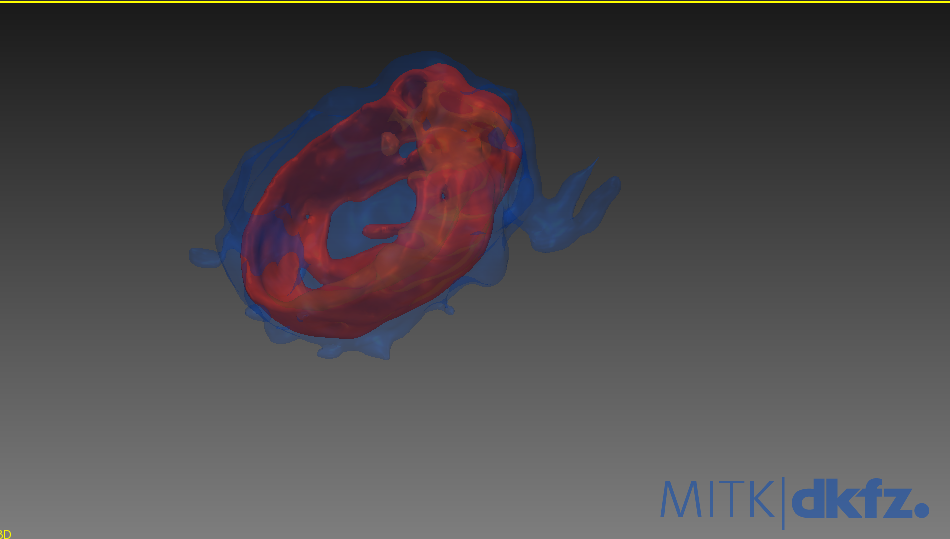

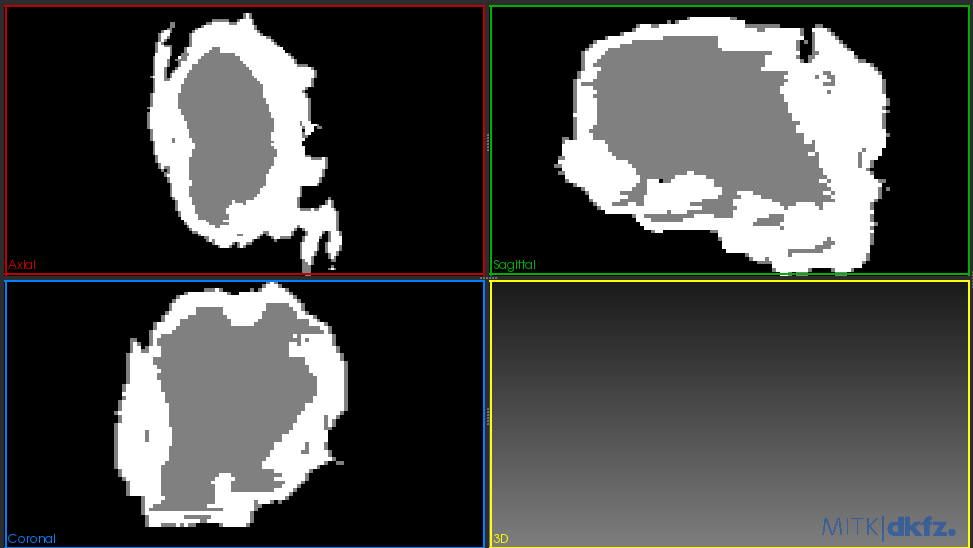

### Egy kép

In [ ]:
import numpy as np
x = np.load('./Extracted Data/gt_try.npy')
x[x > 0] = 1
np.save('./LCC/binary_label_try.npy',x)

x.shape

(1, 155, 240, 240)

In [ ]:
import nibabel as nib
import numpy as np

bin=np.load('./LCC/binary_label_try.npy')

data_img = np.transpose(bin,(3,2,1,0))
img = nib.Nifti1Image(data_img, np.eye(4))  

img.header.get_xyzt_units()
img.to_filename(os.path.join('./LCC/gt_try_cc.nii.gz')) 

In [ ]:
import SimpleITK as sitk
import nibabel as nib
import numpy as np

gt_try=[]

image = sitk.ReadImage(('./LCC/gt_try_cc.nii.gz'), imageIO="NiftiImageIO")

cc = sitk.ConnectedComponentImageFilter()
cc_img=cc.Execute(image)
relab=sitk.RelabelComponent(cc_img)
sitk.WriteImage(relab, ('./LCC/gt_cc_try.nii.gz'))

img_itk = sitk.ReadImage('./LCC/gt_cc_try.nii.gz')
seg =  sitk.GetArrayFromImage(img_itk)

gt_try.append(seg)
gt_try = np.asarray(gt_try,dtype=np.uint8)
gt_try[gt_try != 1] = 0
np.save('./LCC/gt_cc_try.npy', gt_try)


bin=np.load('./LCC/gt_cc_try.npy')

data_img = np.transpose(bin,(3,2,1,0))
img = nib.Nifti1Image(data_img, np.eye(4))  

img.header.get_xyzt_units()
img.to_filename(os.path.join('./LCC/gt_try:238.nii.gz')) 

In [ ]:
import numpy as np
ccl_img=np.load('./LCC/gt_cc_try.npy')
original_img = np.load('./Extracted Data/gt_try.npy')
fus_img = np.multiply(ccl_img,original_img)
np.save('./Bemutato/fus_img.npy', fus_img)

bin=np.load('./Bemutato/fus_img.npy')

data_img = np.transpose(bin,(3,2,1,0))
img = nib.Nifti1Image(data_img, np.eye(4))  

img.header.get_xyzt_units()
img.to_filename(os.path.join('./Bemutato/fus_img_238.nii.gz')) 

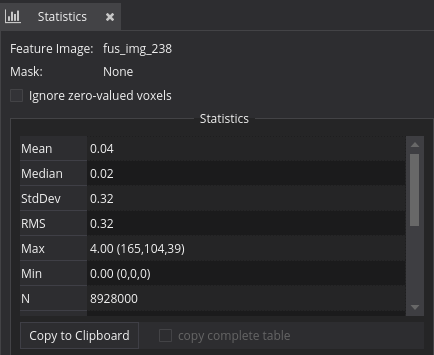

### Több kép

In [ ]:
import numpy as np
x = np.load('./Extracted Data/gt1.npy')
x[x > 0] = 1
np.save('./LCC/binary_label1.npy',x)

x.shape

(12, 155, 240, 240)

In [ ]:
import nibabel as nib
import numpy as np

bin=np.load('./LCC/binary_label1.npy')

for p in range(bin.shape[0]):


  k=int(p)
  num_str=str(p)

  single_img=bin[k,:,:,:]

  data_img = single_img
  img = nib.Nifti1Image(data_img, np.eye(4))  

  img.header.get_xyzt_units()
  img.to_filename(os.path.join('./LCC/binary_label'+num_str+'.nii.gz')) 



In [ ]:
import SimpleITK as sitk
import nibabel as nib
import numpy as np

gt_try=[]
for p in range(bin.shape[0]):
  
  image = sitk.ReadImage(('./LCC/binary_label'+num_str+'.nii.gz'), imageIO="NiftiImageIO")

  cc = sitk.ConnectedComponentImageFilter()
  cc_img=cc.Execute(image)
  relab=sitk.RelabelComponent(cc_img)
  sitk.WriteImage(relab, ('./LCC/gt_cc_try'+num_str+'.nii.gz'))

  img_itk = sitk.ReadImage('./LCC/gt_cc_try'+num_str+'.nii.gz')
  seg =  sitk.GetArrayFromImage(img_itk)

  gt_try.append(seg)
  gt_try = np.asarray(gt_try,dtype=np.uint8)
  gt_try[gt_try != 1] = 0
  np.save('./LCC/gt_cc_try'+num_str+'.npy', gt_try)


  bin=np.load('./LCC/gt_cc_try'+num_str+'.npy')

  data_img = np.transpose(bin,(3,2,1,0))
  img = nib.Nifti1Image(data_img, np.eye(4))  

  img.header.get_xyzt_units()
  img.to_filename(os.path.join('./LCC/gt_try'+num_str+'nii.gz')) 

## Előfeldolgozott teszt adatok betöltése, tesztelés, kiértékelés

*   Itt is el kell végeznünk a one-hot miatt a 4 -> 3 konvertálását
*   Értékelés: dice coefficiens és loss



In [ ]:
import numpy as np

X_test = np.load('./Extracted Data/data00.npy')
Y_test = np.load('./Extracted Data/gt00.npy')

print(X_test.shape)
print(Y_test.shape)

X_test = np.transpose(X_test,(0,2,3,4,1))

print(X_test.shape)
print(Y_test.shape)

X_test = X_test[:,30:120,30:222,30:222,:]
Y_test = Y_test[:,30:120,30:222,30:222]

print(X_test.shape)
print(Y_test.shape)


X_test = X_test.reshape(-1,192,192,4)
Y_test = Y_test.reshape(-1,192,192,1)

print(X_test.shape)
print(Y_test.shape)

(8, 4, 155, 240, 240)
(8, 155, 240, 240)
(8, 155, 240, 240, 4)
(8, 155, 240, 240)
(8, 90, 192, 192, 4)
(8, 90, 192, 192)
(720, 192, 192, 4)
(720, 192, 192, 1)


In [ ]:
Y_test[np.where(Y_test==4.00)]=3

In [ ]:
Y_pre = np.argmax(model.predict(X_test),axis=-1)

In [ ]:
np.unique(Y_pre)

array([0, 1, 2, 3])

In [ ]:
Y_pre.shape

(720, 192, 192)

In [ ]:
Y_pre=Y_pre.reshape(-1,192,192,1)

In [ ]:
Y_test.shape,X_test.shape

((720, 192, 192, 1), (720, 192, 192, 4))

In [ ]:
model.load_weights('./Model Checkpoints/weights_75epoch.hdf5') #ha nem közvetlen tanítás után tesztelünk akkor be kell tölteni a súlyokat 

In [ ]:
from keras.utils import to_categorical
Y_test_encod = to_categorical(Y_test)

In [ ]:
model.evaluate(X_test,Y_test_encod,verbose=0) 

[0.001352606457658112, 0.9986476302146912]

In [ ]:
np.save('./Teszt/299/75 epoch/299_75_4.npy', Y_pre)

In [ ]:
import matplotlib.pyplot as plt
for i in range(20,X_test.shape[0]-20):
  print('Teszteredmények: '+ 'szelet szám: ' + str(i))
  plt.imshow(X_test[i,:,:,2])
  plt.show()
  print('Prediktált:- ')
  plt.imshow(Y_pre[i,:,:,0])
  plt.show()
  print('Eredeti:- ')
  plt.imshow(Y_test[i,:,:,0])
  plt.show()

## Metrikák

*   Dice Score




In [ ]:
import numpy
from scipy.ndimage import _ni_support
from scipy.ndimage.morphology import distance_transform_edt, binary_erosion,\
    generate_binary_structure
from scipy.ndimage.measurements import label, find_objects
from scipy.stats import pearsonr

In [ ]:
import numpy 

def dc(result, reference):

    result = numpy.atleast_1d(result.astype(numpy.bool))
    reference = numpy.atleast_1d(reference.astype(numpy.bool))
    
    intersection = numpy.count_nonzero(result & reference)
    
    size_i1 = numpy.count_nonzero(result)
    size_i2 = numpy.count_nonzero(reference)
    
    try:
        dc = 2. * intersection / float(size_i1 + size_i2)
    except ZeroDivisionError:
        dc = 0.0
    
    return dc


## Dice Score Régióként 

### Egész tumor




In [ ]:
import numpy as np

X_test = np.load('./Extracted Data/Reduced Data/data0.npy')
Y_test = np.load('./Extracted Data/Reduced GT/gt0.npy')

print(X_test.shape)
print(Y_test.shape)

X_test = np.transpose(X_test,(0,2,3,4,1))

print(X_test.shape)
print(Y_test.shape)

X_test = X_test[:,30:120,30:222,30:222,:]
Y_test = Y_test[:,30:120,30:222,30:222]

print(X_test.shape)
print(Y_test.shape)


X_test = X_test.reshape(-1,192,192,4)
Y_test = Y_test.reshape(-1,192,192,1)

print(X_test.shape)
print(Y_test.shape)

(5, 4, 155, 240, 240)
(5, 155, 240, 240)
(5, 155, 240, 240, 4)
(5, 155, 240, 240)
(5, 90, 192, 192, 4)
(5, 90, 192, 192)
(450, 192, 192, 4)
(450, 192, 192, 1)


In [ ]:
Y_test[np.where(Y_test==4.00)]=3

In [ ]:
Y_pre = np.argmax(model.predict(X_test),axis=-1)

In [ ]:
np.unique(Y_pre)

array([0, 1, 2, 3])

In [ ]:
Y_pre.shape

(450, 192, 192)

In [ ]:
Y_pre=Y_pre.reshape(-1,192,192,1)

In [ ]:
Y_test.shape,X_test.shape

((450, 192, 192, 1), (450, 192, 192, 4))

In [ ]:
model.load_weights('./Model Checkpoints/weights_125epoch.hdf5') #ha nem közvetlen tanítás után tesztelünk akkor be kell tölteni a súlyokat 

In [ ]:
from keras.utils import to_categorical
Y_test_encod = to_categorical(Y_test)

In [ ]:
model.evaluate(X_test,Y_test_encod,verbose=0) 

[0.00160507345572114, 0.9983952641487122]

In [ ]:
#import matplotlib.pyplot as plt
#for i in range(20,X_test.shape[0]-20):
#  print('Teszteredmények: '+ 'szelet szám: ' + str(i))
#  plt.imshow(X_test[i,:,:,2])
#  plt.show()
#  print('Prediktált:- ')
#  plt.imshow(Y_pre[i,:,:,0])
#  plt.show()
#  print('Eredeti:- ')
#  plt.imshow(Y_test[i,:,:,0])
#  plt.show()

In [ ]:
Y_test[np.where(Y_test!=0.00)]=1
Y_pre[np.where(Y_pre!=0.00)]=1

dc(Y_pre,Y_test)

0.9769169294795436

### Nem növekvő régió




In [ ]:
import numpy as np

X_test = np.load('./Extracted Data/Reduced Data/data0.npy')
Y_test = np.load('./Extracted Data/Reduced GT/gt0.npy')

print(X_test.shape)
print(Y_test.shape)

X_test = np.transpose(X_test,(0,2,3,4,1))

print(X_test.shape)
print(Y_test.shape)

X_test = X_test[:,30:120,30:222,30:222,:]
Y_test = Y_test[:,30:120,30:222,30:222]

print(X_test.shape)
print(Y_test.shape)


X_test = X_test.reshape(-1,192,192,4)
Y_test = Y_test.reshape(-1,192,192,1)

print(X_test.shape)
print(Y_test.shape)

(5, 4, 155, 240, 240)
(5, 155, 240, 240)
(5, 155, 240, 240, 4)
(5, 155, 240, 240)
(5, 90, 192, 192, 4)
(5, 90, 192, 192)
(450, 192, 192, 4)
(450, 192, 192, 1)


In [ ]:
Y_test[np.where(Y_test==4.00)]=3

In [ ]:
Y_pre = np.argmax(model.predict(X_test),axis=-1)

In [ ]:
np.unique(Y_pre)

array([0, 1, 2, 3])

In [ ]:
Y_pre.shape

(450, 192, 192)

In [ ]:
Y_pre=Y_pre.reshape(-1,192,192,1)

In [ ]:
Y_test.shape,X_test.shape

((450, 192, 192, 1), (450, 192, 192, 4))

In [ ]:
model.load_weights('./Model Checkpoints/weights_125epoch.hdf5') #ha nem közvetlen tanítás után tesztelünk akkor be kell tölteni a súlyokat 

In [ ]:
from keras.utils import to_categorical
Y_test_encod = to_categorical(Y_test)

In [ ]:
model.evaluate(X_test,Y_test_encod,verbose=0) 

[0.00160507345572114, 0.9983952641487122]

In [ ]:
Y_test[np.where(Y_test!=1.00)]=0
Y_pre[np.where(Y_pre!=1.00)]=0

dc(Y_pre,Y_test)

0.9171011068594468

### Öedéma




In [ ]:
import numpy as np

X_test = np.load('./Extracted Data/Reduced Data/data0.npy')
Y_test = np.load('./Extracted Data/Reduced GT/gt0.npy')

print(X_test.shape)
print(Y_test.shape)

X_test = np.transpose(X_test,(0,2,3,4,1))

print(X_test.shape)
print(Y_test.shape)

X_test = X_test[:,30:120,30:222,30:222,:]
Y_test = Y_test[:,30:120,30:222,30:222]

print(X_test.shape)
print(Y_test.shape)


X_test = X_test.reshape(-1,192,192,4)
Y_test = Y_test.reshape(-1,192,192,1)

print(X_test.shape)
print(Y_test.shape)

(5, 4, 155, 240, 240)
(5, 155, 240, 240)
(5, 155, 240, 240, 4)
(5, 155, 240, 240)
(5, 90, 192, 192, 4)
(5, 90, 192, 192)
(450, 192, 192, 4)
(450, 192, 192, 1)


In [ ]:
Y_test[np.where(Y_test==4.00)]=3

In [ ]:
Y_pre = np.argmax(model.predict(X_test),axis=-1)

In [ ]:
np.unique(Y_pre)

array([0, 1, 2, 3])

In [ ]:
Y_pre.shape

(450, 192, 192)

In [ ]:
Y_pre=Y_pre.reshape(-1,192,192,1)

In [ ]:
Y_test.shape,X_test.shape

((450, 192, 192, 1), (450, 192, 192, 4))

In [ ]:
model.load_weights('./Model Checkpoints/weights_125epoch.hdf5') #ha nem közvetlen tanítás után tesztelünk akkor be kell tölteni a súlyokat 

In [ ]:
from keras.utils import to_categorical
Y_test_encod = to_categorical(Y_test)

In [ ]:
model.evaluate(X_test,Y_test_encod,verbose=0) 

[0.00160507345572114, 0.9983952641487122]

In [ ]:
Y_test[np.where(Y_test!=2.00)]=0
Y_pre[np.where(Y_pre!=2.00)]=0

dc(Y_pre,Y_test)

0.96761376437849

### Növekvő régió





In [ ]:
import numpy as np

X_test = np.load('./Extracted Data/Reduced Data/data0.npy')
Y_test = np.load('./Extracted Data/Reduced GT/gt0.npy')

print(X_test.shape)
print(Y_test.shape)

X_test = np.transpose(X_test,(0,2,3,4,1))

print(X_test.shape)
print(Y_test.shape)

X_test = X_test[:,30:120,30:222,30:222,:]
Y_test = Y_test[:,30:120,30:222,30:222]

print(X_test.shape)
print(Y_test.shape)


X_test = X_test.reshape(-1,192,192,4)
Y_test = Y_test.reshape(-1,192,192,1)

print(X_test.shape)
print(Y_test.shape)

(5, 4, 155, 240, 240)
(5, 155, 240, 240)
(5, 155, 240, 240, 4)
(5, 155, 240, 240)
(5, 90, 192, 192, 4)
(5, 90, 192, 192)
(450, 192, 192, 4)
(450, 192, 192, 1)


In [ ]:
Y_test[np.where(Y_test==4.00)]=3

In [ ]:
Y_pre = np.argmax(model.predict(X_test),axis=-1)

In [ ]:
np.unique(Y_pre)

array([0, 1, 2, 3])

In [ ]:
Y_pre.shape

(450, 192, 192)

In [ ]:
Y_pre=Y_pre.reshape(-1,192,192,1)

In [ ]:
Y_test.shape,X_test.shape

((450, 192, 192, 1), (450, 192, 192, 4))

In [ ]:
model.load_weights('./Model Checkpoints/weights_125epoch.hdf5') #ha nem közvetlen tanítás után tesztelünk akkor be kell tölteni a súlyokat 

In [ ]:
from keras.utils import to_categorical
Y_test_encod = to_categorical(Y_test)

In [ ]:
model.evaluate(X_test,Y_test_encod,verbose=0) 

[0.00160507345572114, 0.9983952641487122]

In [ ]:
Y_test[np.where(Y_test!=3.00)]=0
Y_pre[np.where(Y_pre!=3.00)]=0

dc(Y_pre,Y_test)

0.9242689484633199

In [ ]:
import numpy
from scipy.ndimage import _ni_support
from scipy.ndimage.morphology import distance_transform_edt, binary_erosion,\
    generate_binary_structure
from scipy.ndimage.measurements import label, find_objects
from scipy.stats import pearsonr

In [ ]:
import numpy 

def dc(result, reference):

    result = numpy.atleast_1d(result.astype(numpy.bool))
    reference = numpy.atleast_1d(reference.astype(numpy.bool))
    
    intersection = numpy.count_nonzero(result & reference)
    
    size_i1 = numpy.count_nonzero(result)
    size_i2 = numpy.count_nonzero(reference)
    
    try:
        dc = 2. * intersection / float(size_i1 + size_i2)
    except ZeroDivisionError:
        dc = 0.0
    
    return dc


In [ ]:
dc(Y_pre,Y_test)

0.9242689484633199

# Egyéb függelékek

## Pár példa a predikció végeredményére

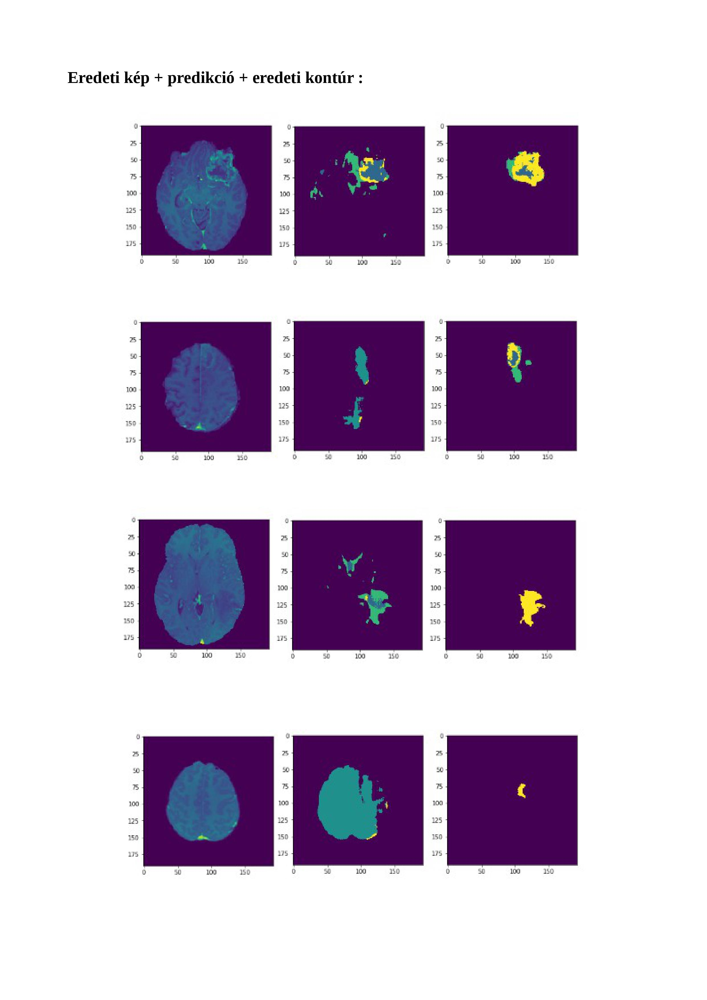

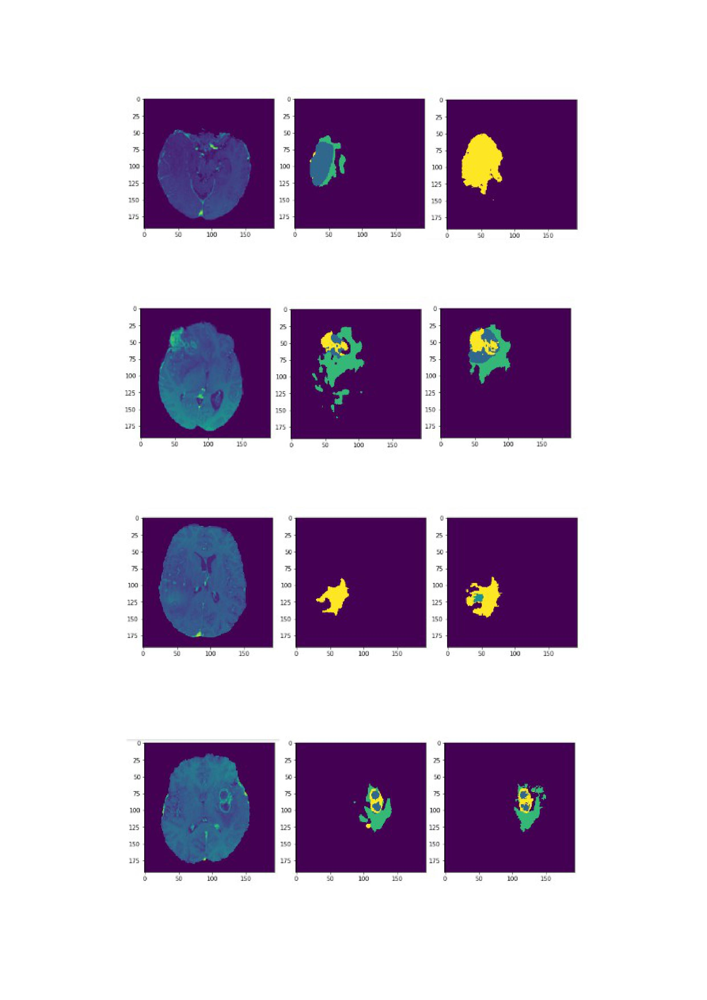

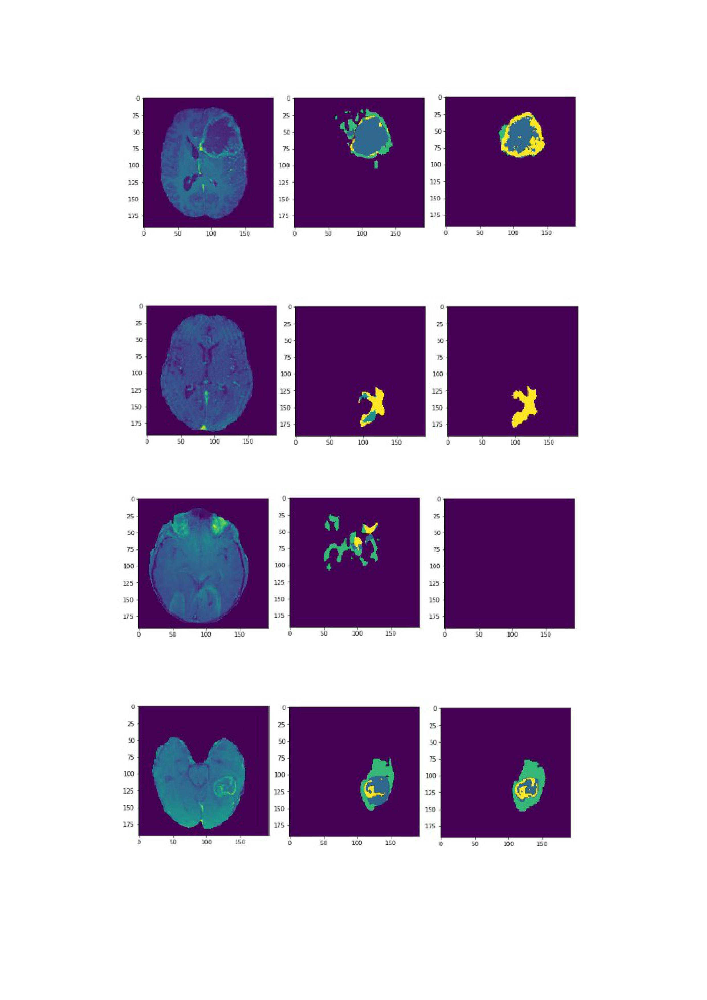

## 100 teszt kép eredménye


*   100 epoch
*   patch
*   LCC-vel és nélküle



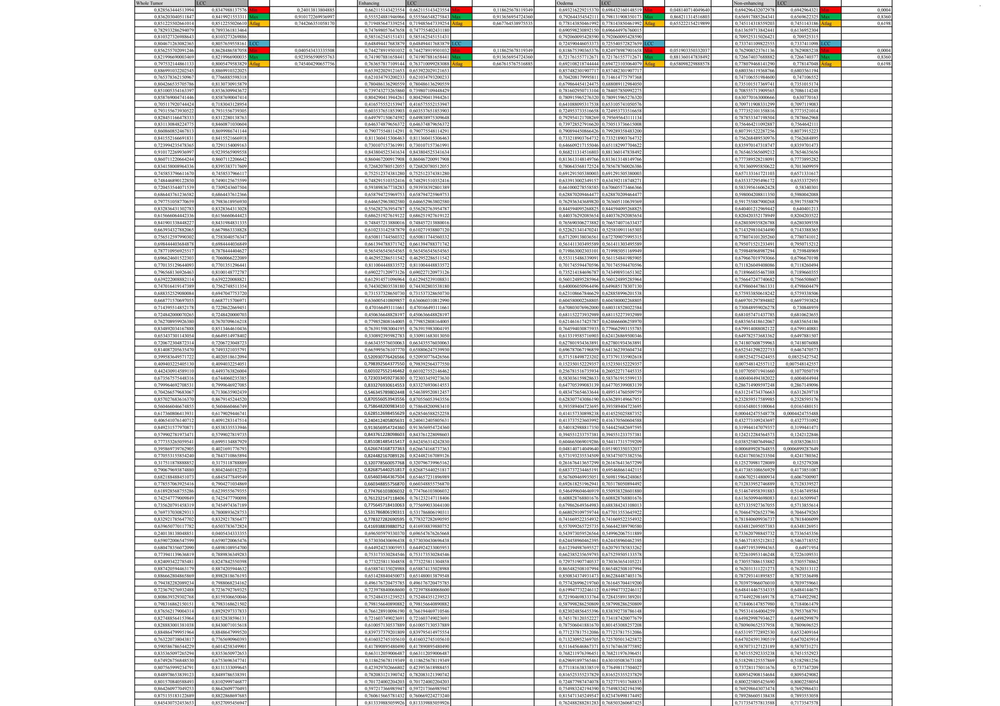